DL Work

In [ ]:
import pandas as pd
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!ls -l "/content/drive/MyDrive/CelebA"


total 28865
-rw------- 1 root root 26721026 May  2 21:41 list_attr_celeba.txt
-rw------- 1 root root  2836386 May  2 21:41 list_eval_partition.txt


In [ ]:
!cp '/content/drive/MyDrive/img_align_celeba.zip' .

!unzip -o img_align_celeba.zip -d img_align_celeba

!ls -l img_align_celeba | head -n 10

!find img_align_celeba -type f | wc -l


Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/img_align_celeba/197603.jpg  
 extracting: img_align_celeba/img_align_celeba/197604.jpg  
 extracting: img_align_celeba/img_align_celeba/197605.jpg  
 extracting: img_align_celeba/img_align_celeba/197606.jpg  
 extracting: img_align_celeba/img_align_celeba/197607.jpg  
 extracting: img_align_celeba/img_align_celeba/197608.jpg  
 extracting: img_align_celeba/img_align_celeba/197609.jpg  
 extracting: img_align_celeba/img_align_celeba/197610.jpg  
 extracting: img_align_celeba/img_align_celeba/197611.jpg  
 extracting: img_align_celeba/img_align_celeba/197612.jpg  
 extracting: img_align_celeba/img_align_celeba/197613.jpg  
 extracting: img_align_celeba/img_align_celeba/197614.jpg  
 extracting: img_align_celeba/img_align_celeba/197615.jpg  
 extracting: img_align_celeba/img_align_celeba/197616.jpg  
 extracting: img_align_celeba/img_align_celeba/197617.jpg  
 extracting: img_align_celeba/img_align_celeba/19

In [ ]:
attr_file_path = '/content/drive/MyDrive/CelebA/list_attr_celeba.txt'
eval_file_path = '/content/drive/MyDrive/CelebA/list_eval_partition.txt'
img_dir = '/content/img_align_celeba/img_align_celeba'


with open(attr_file_path, 'r') as f:
    lines = f.read().strip().split('\n')

num_images = int(lines[0])
attribute_names = lines[1].split()

print("Number of images (from attribute file):", num_images)
print("Attribute names:", attribute_names)

Number of images (from attribute file): 202599
Attribute names: ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


In [ ]:
import pandas as pd
print("First 5 lines of the attribute file:")
for line in lines[:5]:
    print(line.strip())
df_attr = pd.read_csv(attr_file_path, delim_whitespace=True, skiprows=2)
print("\nShape of the attributes dataframe:", df_attr.shape)
df_attr.head(5)


First 5 lines of the attribute file:
202599
5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young
000001.jpg -1  1  1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1  1  1 -1  1 -1 -1  1 -1 -1  1 -1 -1 -1  1  1 -1  1 -1  1 -1 -1  1
000002.jpg -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1 -1  1 -1 -1  1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1
000003.jpg -1 -1 -1 -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1  1  1 -1 -1  1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1  1


<ipython-input-6-ffa900118800>:9: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_attr = pd.read_csv(attr_file_path, delim_whitespace=True, skiprows=2)



Shape of the attributes dataframe: (202598, 41)


,000001.jpg,-1,1,1.1,-1.1,-1.2,-1.3,-1.4,-1.5,-1.6,...,-1.22,1.8,1.9,-1.23,1.10,-1.24,1.11,-1.25,-1.26,1.12
0,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
1,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
2,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
3,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
4,000006.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,1,-1,1,-1,-1,1


In [ ]:
import os
import glob

df_attr = pd.read_csv(attr_file_path, sep='\s+', skiprows=2, header=None)
df_attr.columns = ['image_id'] + attribute_names


In [ ]:
df_partition = pd.read_csv(eval_file_path, sep='\s+', header=None, names=['image_id', 'partition'])
df_merged = pd.merge(df_attr, df_partition, on='image_id', how='inner')
for attr in attribute_names:
    df_merged[attr] = df_merged[attr].apply(lambda x: 0 if x == -1 else 1)
train_df = df_merged[df_merged['partition'] == 0].reset_index(drop=True)
val_df   = df_merged[df_merged['partition'] == 1].reset_index(drop=True)
test_df  = df_merged[df_merged['partition'] == 2].reset_index(drop=True)

print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))
print("Test samples:", len(test_df))

Training samples: 162770
Validation samples: 19867
Test samples: 19962


In [ ]:
print("Descriptive Statistics for Attribute Labels:")
print(df_attr.describe())
missing_values = df_attr.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)


Descriptive Statistics for Attribute Labels:
       5_o_Clock_Shadow  Arched_Eyebrows    Attractive  Bags_Under_Eyes  \
count     202599.000000    202599.000000  202599.00000    202599.000000   
mean          -0.777728        -0.466039       0.02501        -0.590857   
std            0.628602         0.884766       0.99969         0.806778   
min           -1.000000        -1.000000      -1.00000        -1.000000   
25%           -1.000000        -1.000000      -1.00000        -1.000000   
50%           -1.000000        -1.000000       1.00000        -1.000000   
75%           -1.000000         1.000000       1.00000        -1.000000   
max            1.000000         1.000000       1.00000         1.000000   

                Bald          Bangs       Big_Lips       Big_Nose  \
count  202599.000000  202599.000000  202599.000000  202599.000000   
mean       -0.955113      -0.696849      -0.518408      -0.530935   
std         0.296241       0.717219       0.855135       0.847414   
min

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
class CelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None, attr_names=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.attr_names = attr_names
        available_indices = []
        for i in range(len(self.df)):
            img_path = os.path.join(self.img_dir, self.df.iloc[i]['image_id'])
            if os.path.exists(img_path):
                available_indices.append(i)
            else:
                print(f"Warning: File {img_path} not found. Skipping this sample.")
        self.df = self.df.iloc[available_indices].reset_index(drop=True)
        print(f"Filtered dataset: {len(self.df)} samples available.")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row['image_id']
        img_path = os.path.join(self.img_dir, img_name)
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
            image = Image.new('RGB', (224, 224), (0, 0, 0))
        if self.transform:
            image = self.transform(image)
        labels = row[self.attr_names].values.astype('float32')
        return image, labels

train_dataset = CelebADataset(train_df, img_dir, transform, attr_names=attribute_names)
val_dataset   = CelebADataset(val_df,   img_dir, transform, attr_names=attribute_names)
test_dataset  = CelebADataset(test_df,  img_dir, transform, attr_names=attribute_names)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

print("Number of training samples in dataset:", len(train_dataset))
print("Number of validation samples in dataset:", len(val_dataset))
print("Number of test samples in dataset:", len(test_dataset))

Filtered dataset: 162770 samples available.
Filtered dataset: 19867 samples available.
Filtered dataset: 19962 samples available.
Number of training samples in dataset: 162770
Number of validation samples in dataset: 19867
Number of test samples in dataset: 19962


In [ ]:
!ls -l "/content/img_align_celeba/img_align_celeba" | head -n 10


total 1737936
-rw-r--r-- 1 root root 11440 Sep 28  2015 000001.jpg
-rw-r--r-- 1 root root  7448 Sep 28  2015 000002.jpg
-rw-r--r-- 1 root root  4253 Sep 28  2015 000003.jpg
-rw-r--r-- 1 root root 10747 Sep 28  2015 000004.jpg
-rw-r--r-- 1 root root  6351 Sep 28  2015 000005.jpg
-rw-r--r-- 1 root root  8073 Sep 28  2015 000006.jpg
-rw-r--r-- 1 root root  8203 Sep 28  2015 000007.jpg
-rw-r--r-- 1 root root  7725 Sep 28  2015 000008.jpg
-rw-r--r-- 1 root root  8641 Sep 28  2015 000009.jpg


In [ ]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import os

import torch

def add_random_mask(image, mask_size=56):
    _, H, W = image.shape

    top = torch.randint(low=0, high=H - mask_size + 1, size=(1,)).item()
    left = torch.randint(low=0, high=W - mask_size + 1, size=(1,)).item()

    masked_image = image.clone()
    mask = torch.zeros_like(image)

    mask[:, top:top+mask_size, left:left+mask_size] = 1.0
    masked_image[:, top:top+mask_size, left:left+mask_size] = 0.0
    return masked_image, mask


class InpaintingCelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row['image_id']
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        masked_image, mask = add_random_mask(image, mask_size=56)
        return masked_image, mask, image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

img_dir = '/content/img_align_celeba/img_align_celeba'

inpaint_train_dataset = InpaintingCelebADataset(train_df, img_dir, transform)
inpaint_train_loader = torch.utils.data.DataLoader(inpaint_train_dataset, batch_size=32, shuffle=True, num_workers=2)
print("Inpainting training samples:", len(inpaint_train_dataset))


Inpainting training samples: 162770


Filtered dataset: 162770 samples available.
Filtered dataset: 19867 samples available.
Filtered dataset: 19962 samples available.
Starting training...


  0%|          | 1/625 [00:00<07:05,  1.47it/s]

[Epoch 0/2] [Batch 0/625] [D loss: 0.7170] [G loss: 5.9274]


 16%|█▌        | 101/625 [00:36<03:09,  2.77it/s]

[Epoch 0/2] [Batch 100/625] [D loss: 0.6920] [G loss: 1.7010]


 32%|███▏      | 201/625 [01:13<02:35,  2.72it/s]

[Epoch 0/2] [Batch 200/625] [D loss: 0.7950] [G loss: 1.5991]


 48%|████▊     | 301/625 [01:50<02:00,  2.70it/s]

[Epoch 0/2] [Batch 300/625] [D loss: 0.3885] [G loss: 2.1790]


 64%|██████▍   | 401/625 [02:27<01:26,  2.59it/s]

[Epoch 0/2] [Batch 400/625] [D loss: 0.5558] [G loss: 2.3852]


 80%|████████  | 501/625 [03:05<00:46,  2.67it/s]

[Epoch 0/2] [Batch 500/625] [D loss: 0.7681] [G loss: 1.6941]


 96%|█████████▌| 601/625 [03:42<00:08,  2.70it/s]

[Epoch 0/2] [Batch 600/625] [D loss: 0.2210] [G loss: 3.4807]


100%|██████████| 625/625 [03:51<00:00,  2.70it/s]


Epoch 0 completed. Avg D loss: 0.5781, Avg G loss: 2.2639


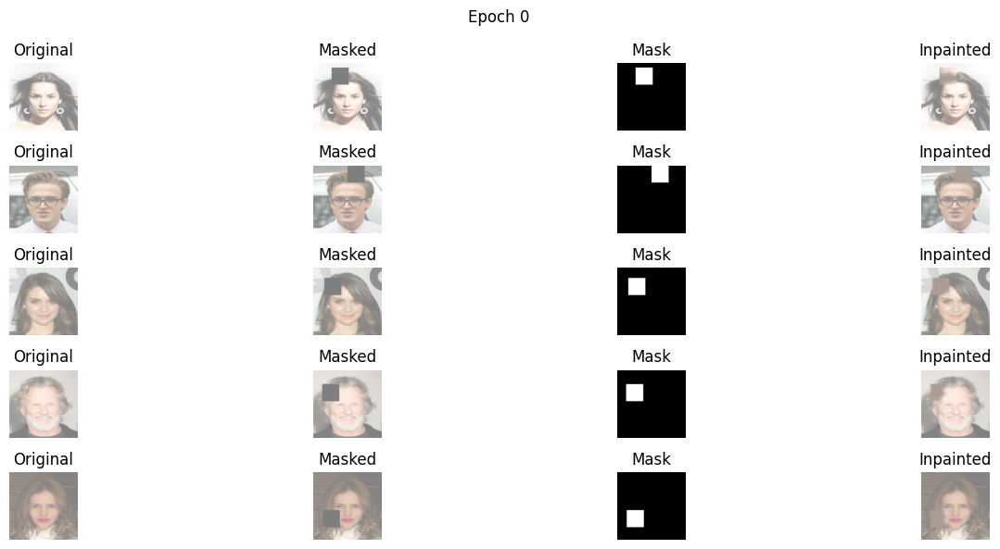

  0%|          | 1/625 [00:00<06:30,  1.60it/s]

[Epoch 1/2] [Batch 0/625] [D loss: 0.3403] [G loss: 2.6759]


 16%|█▌        | 101/625 [00:37<03:14,  2.69it/s]

[Epoch 1/2] [Batch 100/625] [D loss: 0.4848] [G loss: 2.3655]


 32%|███▏      | 201/625 [01:15<02:38,  2.67it/s]

[Epoch 1/2] [Batch 200/625] [D loss: 0.6739] [G loss: 1.6001]


 48%|████▊     | 301/625 [01:52<02:03,  2.63it/s]

[Epoch 1/2] [Batch 300/625] [D loss: 0.0475] [G loss: 4.5829]


 64%|██████▍   | 401/625 [02:30<01:23,  2.67it/s]

[Epoch 1/2] [Batch 400/625] [D loss: 0.8038] [G loss: 1.3550]


 80%|████████  | 501/625 [03:07<00:45,  2.70it/s]

[Epoch 1/2] [Batch 500/625] [D loss: 0.6746] [G loss: 2.6354]


 96%|█████████▌| 601/625 [03:45<00:08,  2.71it/s]

[Epoch 1/2] [Batch 600/625] [D loss: 0.1567] [G loss: 3.5445]


100%|██████████| 625/625 [03:54<00:00,  2.67it/s]

Epoch 1 completed. Avg D loss: 0.3523, Avg G loss: 3.1971


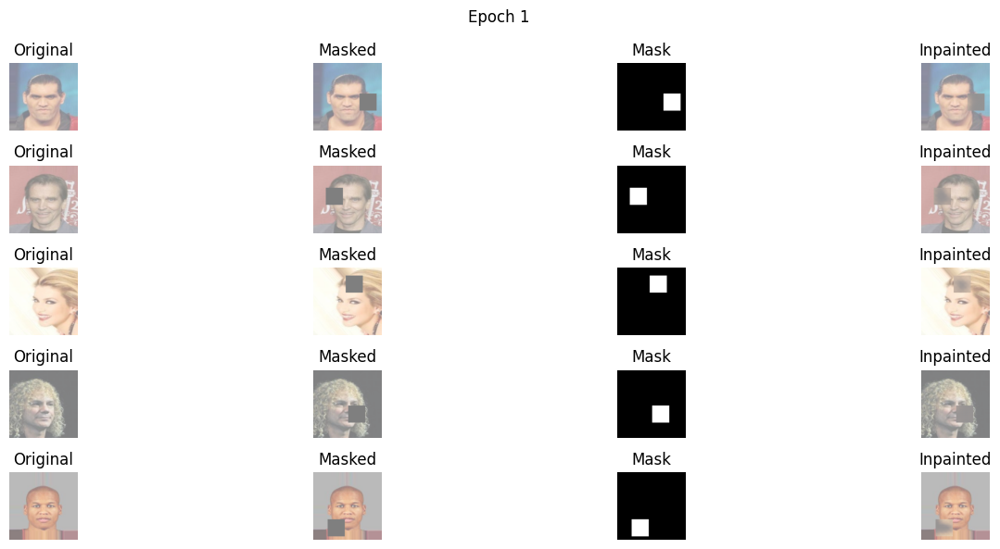

Evaluating on test set...


100%|██████████| 1248/1248 [01:33<00:00, 13.29it/s]

Average PSNR on masked regions: 23.18 dB
Final Test PSNR: 23.18 dB


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

        self.mask_processor = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.AdaptiveAvgPool2d((7, 7))
        )

    def forward(self, x, mask):
        encoded = self.encoder(x)
        processed_mask = self.mask_processor(mask)
        combined = torch.cat([encoded, processed_mask], dim=1)

        out = self.decoder(combined)
        out = x * (1 - mask) + out * mask

        return out

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


generator = Generator().to(device)
discriminator = Discriminator().to(device)

adversarial_loss = nn.BCELoss()
pixelwise_loss = nn.L1Loss()

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

num_epochs = 2
lambda_pixel = 100


train_dataset = CelebADataset(train_df, img_dir, transform, attr_names=attribute_names)
val_dataset = CelebADataset(val_df, img_dir, transform, attr_names=attribute_names)
test_dataset = CelebADataset(test_df, img_dir, transform, attr_names=attribute_names)

inpaint_train_dataset = InpaintingCelebADataset(train_df, img_dir, transform)
inpaint_val_dataset = InpaintingCelebADataset(val_df, img_dir, transform)
inpaint_test_dataset = InpaintingCelebADataset(test_df, img_dir, transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

inpaint_train_loader = DataLoader(inpaint_train_dataset, batch_size=16, shuffle=True, num_workers=2)
inpaint_val_loader = DataLoader(inpaint_val_dataset, batch_size=16, shuffle=False, num_workers=2)
inpaint_test_loader = DataLoader(inpaint_test_dataset, batch_size=16, shuffle=False, num_workers=2)


def train():
    generator.train()
    discriminator.train()

    for epoch in range(num_epochs):
        epoch_loss_D = 0
        epoch_loss_G = 0

        for i, (masked_images, masks, real_images) in enumerate(tqdm(inpaint_train_loader)):

            masked_images = masked_images.to(device)
            masks = masks[:, 0:1, :, :].to(device)
            real_images = real_images.to(device)

            batch_size = masked_images.size(0)
            valid = torch.ones((batch_size, 1, 11, 11), requires_grad=False).to(device)
            fake = torch.zeros((batch_size, 1, 11, 11), requires_grad=False).to(device)


            optimizer_D.zero_grad()

            real_pred = discriminator(real_images)
            loss_real = adversarial_loss(real_pred, valid)

            fake_images = generator(masked_images, masks)
            fake_pred = discriminator(fake_images.detach())
            loss_fake = adversarial_loss(fake_pred, fake)

            loss_D = (loss_real + loss_fake) / 2
            loss_D.backward()
            optimizer_D.step()


            optimizer_G.zero_grad()


            fake_images = generator(masked_images, masks)

            fake_pred = discriminator(fake_images)
            loss_GAN = adversarial_loss(fake_pred, valid)
            loss_pixel = pixelwise_loss(fake_images, real_images)
            loss_G = loss_GAN + lambda_pixel * loss_pixel
            loss_G.backward()
            optimizer_G.step()
            epoch_loss_D += loss_D.item()
            epoch_loss_G += loss_G.item()
            if i % 100 == 0:
                print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}/{len(inpaint_train_loader)}] "
                      f"[D loss: {loss_D.item():.4f}] [G loss: {loss_G.item():.4f}]")
        avg_loss_D = epoch_loss_D / len(inpaint_train_loader)
        avg_loss_G = epoch_loss_G / len(inpaint_train_loader)
        print(f"Epoch {epoch} completed. Avg D loss: {avg_loss_D:.4f}, Avg G loss: {avg_loss_G:.4f}")
        if epoch % 5 == 0:
            torch.save(generator.state_dict(), f"generator_epoch_{epoch}.pth")
            torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch}.pth")
        visualize_results(generator, inpaint_train_loader, epoch)

def visualize_results(generator, dataloader, epoch, num_samples=5):
    generator.eval()

    with torch.no_grad():
        masked_images, masks, real_images = next(iter(dataloader))
        masked_images = masked_images[:num_samples].to(device)
        masks = masks[:num_samples, 0:1, :, :].to(device)
        real_images = real_images[:num_samples].to(device)
        fake_images = generator(masked_images, masks)
        masked_images = masked_images.cpu().numpy().transpose(0, 2, 3, 1)
        masks = masks.cpu().numpy().transpose(0, 2, 3, 1)
        real_images = real_images.cpu().numpy().transpose(0, 2, 3, 1)
        fake_images = fake_images.cpu().numpy().transpose(0, 2, 3, 1)
        plt.figure(figsize=(15, 6))
        for i in range(num_samples):
            plt.subplot(num_samples, 4, i*4 + 1)
            plt.imshow((real_images[i] + 1) / 2)
            plt.title("Original")
            plt.axis("off")
            plt.subplot(num_samples, 4, i*4 + 2)
            plt.imshow((masked_images[i] + 1) / 2)
            plt.title("Masked")
            plt.axis("off")
            plt.subplot(num_samples, 4, i*4 + 3)
            plt.imshow(masks[i], cmap='gray')
            plt.title("Mask")
            plt.axis("off")
            plt.subplot(num_samples, 4, i*4 + 4)
            plt.imshow((fake_images[i] + 1) / 2)
            plt.title("Inpainted")
            plt.axis("off")

        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.savefig(f"results_epoch_{epoch}.png")
        plt.show()

    generator.train()


def calculate_psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(1.0 / torch.sqrt(mse))

def evaluate(generator, dataloader):
    generator.eval()
    total_psnr = 0
    total_samples = 0

    with torch.no_grad():
        for masked_images, masks, real_images in tqdm(dataloader):
            masked_images = masked_images.to(device)
            masks = masks[:, 0:1, :, :].to(device)
            real_images = real_images.to(device)

            fake_images = generator(masked_images, masks)
            masked_fake = fake_images * masks
            masked_real = real_images * masks
            batch_psnr = calculate_psnr(masked_fake, masked_real)

            total_psnr += batch_psnr * masked_images.size(0)
            total_samples += masked_images.size(0)

    avg_psnr = total_psnr / total_samples
    print(f"Average PSNR on masked regions: {avg_psnr:.2f} dB")
    return avg_psnr

print("Starting training...")
train()

print("Evaluating on test set...")
test_psnr = evaluate(generator, inpaint_test_loader)
print(f"Final Test PSNR: {test_psnr:.2f} dB")

# BIG GAN MODEL

In [ ]:
import pandas as pd
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!ls -l "/content/drive/MyDrive/CelebA"

total 1394288
-rw------- 1 root root 1427750792 Apr 30 04:20 img_align_celeba.zip


In [ ]:
!cp '/content/drive/MyDrive/CelebA/img_align_celeba.zip' .


In [ ]:
!unzip -o img_align_celeba.zip -d img_align_celeba


Streaming output truncated to the last 5000 lines.
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197604.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: img_align_celeba/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: img_align_ce

In [ ]:
attr_file_path = 'img_align_celeba/list_attr_celeba.csv'
eval_file_path = 'img_align_celeba/list_eval_partition.csv'
img_dir = 'img_align_celeba/img_align_celeba'


In [ ]:
import pandas as pd

attr_file_path = 'img_align_celeba/list_attr_celeba.csv'


attr_df = pd.read_csv(attr_file_path)

attr_df.iloc[:, 1:] = attr_df.iloc[:, 1:].applymap(lambda x: 1 if x == 1 else 0)

print("Number of images:", attr_df.shape[0])
print("Number of attributes per image:", attr_df.shape[1] - 1)
print("Sample attribute columns:", attr_df.columns[1:6].tolist())


<ipython-input-10-291aa8f9943d>:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  attr_df.iloc[:, 1:] = attr_df.iloc[:, 1:].applymap(lambda x: 1 if x == 1 else 0)


Number of images: 202599
Number of attributes per image: 40
Sample attribute columns: ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald']


In [ ]:
eval_file_path = 'img_align_celeba/list_eval_partition.csv'
df_partition = pd.read_csv(eval_file_path)

df_merged = pd.merge(attr_df, df_partition, on='image_id', how='inner')

train_df = df_merged[df_merged['partition'] == 0].reset_index(drop=True)
val_df   = df_merged[df_merged['partition'] == 1].reset_index(drop=True)
test_df  = df_merged[df_merged['partition'] == 2].reset_index(drop=True)

print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))
print("Test samples:", len(test_df))


Training samples: 162770
Validation samples: 19867
Test samples: 19962


In [ ]:
print("Descriptive Statistics for Attribute Labels:")
print(df_merged.iloc[:, 1:-1].describe())

missing_values = df_merged.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)


Descriptive Statistics for Attribute Labels:
       5_o_Clock_Shadow  Arched_Eyebrows     Attractive  Bags_Under_Eyes  \
count     202599.000000    202599.000000  202599.000000    202599.000000   
mean           0.111136         0.266981       0.512505         0.204572   
std            0.314301         0.442383       0.499845         0.403389   
min            0.000000         0.000000       0.000000         0.000000   
25%            0.000000         0.000000       0.000000         0.000000   
50%            0.000000         0.000000       1.000000         0.000000   
75%            0.000000         1.000000       1.000000         0.000000   
max            1.000000         1.000000       1.000000         1.000000   

                Bald          Bangs       Big_Lips       Big_Nose  \
count  202599.000000  202599.000000  202599.000000  202599.000000   
mean        0.022443       0.151575       0.240796       0.234532   
std         0.148121       0.358610       0.427568       0.4237

In [ ]:
attribute_names = df_merged.columns[1:-1].tolist()


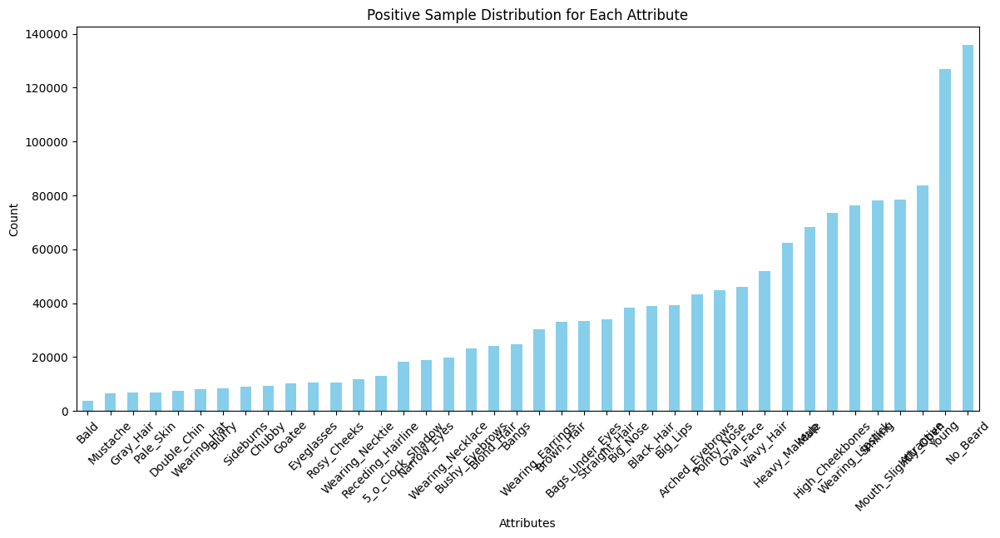

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
positive_counts = train_df[attribute_names].sum(axis=0)
plt.figure(figsize=(14, 6))
positive_counts.sort_values().plot(kind='bar', color='skyblue')
plt.title('Positive Sample Distribution for Each Attribute')
plt.xlabel('Attributes')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


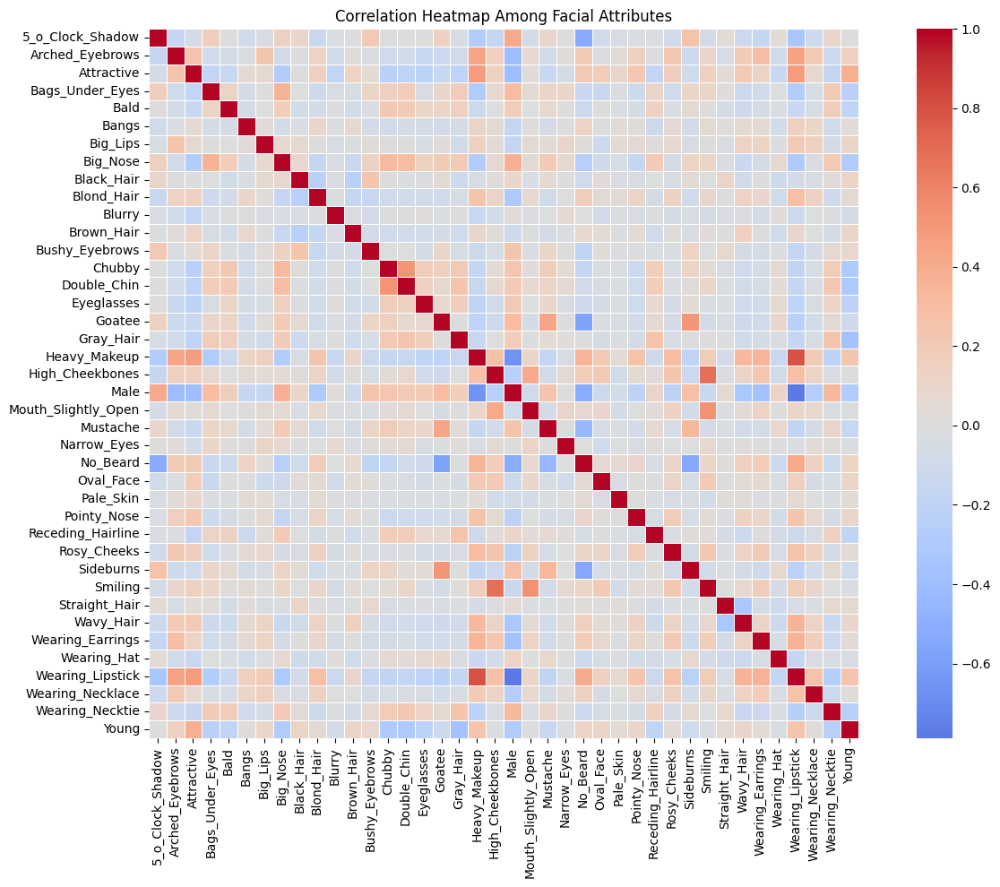

In [ ]:
plt.figure(figsize=(14, 10))
corr_matrix = train_df[attribute_names].corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.title('Correlation Heatmap Among Facial Attributes')
plt.tight_layout()
plt.show()


In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image


img_dir = '/content/img_align_celeba/img_align_celeba/img_align_celeba'


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
class CelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None, attr_names=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.attr_names = attr_names
        available_indices = []
        for i in range(len(self.df)):
            img_path = os.path.join(self.img_dir, self.df.iloc[i]['image_id'])
            if os.path.exists(img_path):
                available_indices.append(i)
            else:
                print(f"Warning: Missing image: {img_path}")
        self.df = self.df.iloc[available_indices].reset_index(drop=True)
        print(f"Filtered dataset to {len(self.df)} valid samples.")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row['image_id']
        img_path = os.path.join(self.img_dir, img_name)
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
            image = Image.new('RGB', (224, 224), (0, 0, 0))
        if self.transform:
            image = self.transform(image)
        labels = row[self.attr_names].values.astype('float32')
        return image, labels
class InpaintingCelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_id = self.df.iloc[idx]['image_id']
        img_path = os.path.join(self.img_dir, image_id)
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        masked_image, mask = add_random_mask(image)
        return masked_image, mask, image
train_dataset = CelebADataset(train_df, img_dir, transform, attr_names=attribute_names)
val_dataset   = CelebADataset(val_df,   img_dir, transform, attr_names=attribute_names)
test_dataset = InpaintingCelebADataset(test_df, img_dir, transform)



train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

print("Number of training samples in dataset:", len(train_dataset))
print("Number of validation samples in dataset:", len(val_dataset))
print("Number of test samples in dataset:", len(test_dataset))

Filtered dataset to 162770 valid samples.
Filtered dataset to 19867 valid samples.
Number of training samples in dataset: 162770
Number of validation samples in dataset: 19867
Number of test samples in dataset: 19962


In [ ]:
!ls -l "/content/img_align_celeba/img_align_celeba/img_align_celeba" | head -n 10


total 1737936
-rw-r--r-- 1 root root 11440 Oct  1  2019 000001.jpg
-rw-r--r-- 1 root root  7448 Oct  1  2019 000002.jpg
-rw-r--r-- 1 root root  4253 Oct  1  2019 000003.jpg
-rw-r--r-- 1 root root 10747 Oct  1  2019 000004.jpg
-rw-r--r-- 1 root root  6351 Oct  1  2019 000005.jpg
-rw-r--r-- 1 root root  8073 Oct  1  2019 000006.jpg
-rw-r--r-- 1 root root  8203 Oct  1  2019 000007.jpg
-rw-r--r-- 1 root root  7725 Oct  1  2019 000008.jpg
-rw-r--r-- 1 root root  8641 Oct  1  2019 000009.jpg


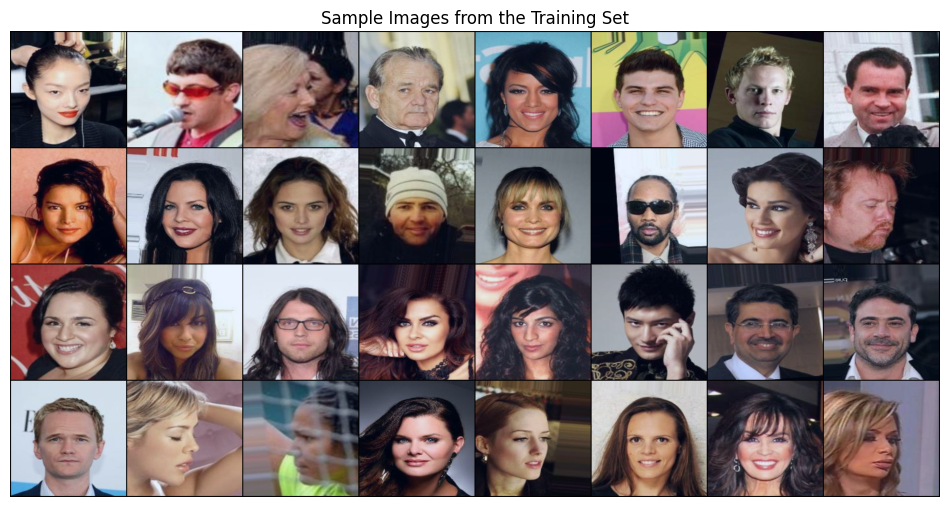

In [ ]:
import matplotlib.pyplot as plt
import torchvision
data_iter = iter(train_loader)
images, labels = next(data_iter)
grid_img = torchvision.utils.make_grid(images, nrow=8, normalize=True)

plt.figure(figsize=(12, 12))
plt.imshow(grid_img.permute(1, 2, 0))
plt.title("Sample Images from the Training Set")
plt.axis("off")
plt.show()


In [ ]:
print("Attribute labels for the first 5 images:")
for i in range(5):
    print(f"Image {i+1}:")
    label_dict = {attr: int(labels[i][j].item()) for j, attr in enumerate(attribute_names)}
    print(label_dict)

Attribute labels for the first 5 images:
Image 1:
{'5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 1, 'Attractive': 1, 'Bags_Under_Eyes': 0, 'Bald': 0, 'Bangs': 0, 'Big_Lips': 0, 'Big_Nose': 0, 'Black_Hair': 1, 'Blond_Hair': 0, 'Blurry': 0, 'Brown_Hair': 0, 'Bushy_Eyebrows': 0, 'Chubby': 0, 'Double_Chin': 0, 'Eyeglasses': 0, 'Goatee': 0, 'Gray_Hair': 0, 'Heavy_Makeup': 1, 'High_Cheekbones': 0, 'Male': 0, 'Mouth_Slightly_Open': 0, 'Mustache': 0, 'Narrow_Eyes': 0, 'No_Beard': 1, 'Oval_Face': 0, 'Pale_Skin': 0, 'Pointy_Nose': 1, 'Receding_Hairline': 0, 'Rosy_Cheeks': 0, 'Sideburns': 0, 'Smiling': 0, 'Straight_Hair': 1, 'Wavy_Hair': 0, 'Wearing_Earrings': 0, 'Wearing_Hat': 0, 'Wearing_Lipstick': 1, 'Wearing_Necklace': 0, 'Wearing_Necktie': 0, 'Young': 1}
Image 2:
{'5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 0, 'Attractive': 0, 'Bags_Under_Eyes': 0, 'Bald': 0, 'Bangs': 0, 'Big_Lips': 0, 'Big_Nose': 0, 'Black_Hair': 0, 'Blond_Hair': 0, 'Blurry': 1, 'Brown_Hair': 0, 'Bushy_Eyebrows': 0, 'Chubby': 0, 

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

def add_random_mask(image, mask_size=32):
    _, H, W = image.shape
    top = torch.randint(0, H - mask_size + 1, (1,)).item()
    left = torch.randint(0, W - mask_size + 1, (1,)).item()

    masked = image.clone()
    mask = torch.zeros_like(image)
    mask[:, top:top+mask_size, left:left+mask_size] = 1
    masked[:, top:top+mask_size, left:left+mask_size] = 0
    return masked, mask

class InpaintingCelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_id = self.df.iloc[idx]['image_id']
        img_path = os.path.join(self.img_dir, image_id)
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        masked_image, mask = add_random_mask(image)
        return masked_image, mask, image


In [ ]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

img_dir = '/content/img_align_celeba/img_align_celeba/img_align_celeba'

inpaint_train_dataset = InpaintingCelebADataset(train_df, img_dir, transform)
inpaint_train_loader = DataLoader(inpaint_train_dataset, batch_size=32, shuffle=True, num_workers=2)


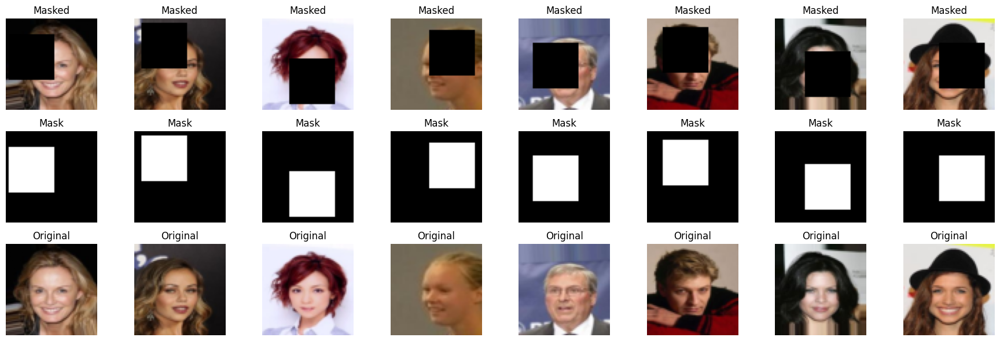

In [ ]:
import matplotlib.pyplot as plt
import torchvision
data_iter = iter(inpaint_train_loader)
masked_imgs, masks, originals = next(data_iter)
num_samples = 8
plt.figure(figsize=(18, 6))
for i in range(num_samples):
    plt.subplot(3, num_samples, i + 1)
    plt.imshow(masked_imgs[i].permute(1, 2, 0))
    plt.title("Masked")
    plt.axis("off")
    plt.subplot(3, num_samples, num_samples + i + 1)
    plt.imshow(masks[i].permute(1, 2, 0))
    plt.title("Mask")
    plt.axis("off")
    plt.subplot(3, num_samples, 2 * num_samples + i + 1)
    plt.imshow(originals[i].permute(1, 2, 0))
    plt.title("Original")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
!pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from tqdm import tqdm
import lpips

lpips_loss_fn = lpips.LPIPS(net='alex').to('cuda' if torch.cuda.is_available() else 'cpu')

class UNetInpaintGenerator(nn.Module):
    def __init__(self, in_channels=6, out_channels=3, ngf=64):
        super().__init__()
        self.enc1 = self.conv_block(in_channels, ngf)
        self.enc2 = self.conv_block(ngf, ngf * 2)
        self.enc3 = self.conv_block(ngf * 2, ngf * 4)
        self.enc4 = self.conv_block(ngf * 4, ngf * 8)

        self.bottleneck = self.conv_block(ngf * 8, ngf * 16)

        self.up4 = self.up_block(ngf * 16, ngf * 8)
        self.up3 = self.up_block(ngf * 8 * 2, ngf * 4)
        self.up2 = self.up_block(ngf * 4 * 2, ngf * 2)
        self.up1 = self.up_block(ngf * 2 * 2, ngf)

        self.final = nn.Conv2d(ngf * 2, out_channels, kernel_size=1)
        self.tanh = nn.Tanh()

    def conv_block(self, in_c, out_c):
        return nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )

    def up_block(self, in_c, out_c):
        return nn.Sequential(
            nn.ConvTranspose2d(in_c, out_c, 2, stride=2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(nn.functional.max_pool2d(e1, 2))
        e3 = self.enc3(nn.functional.max_pool2d(e2, 2))
        e4 = self.enc4(nn.functional.max_pool2d(e3, 2))
        b = self.bottleneck(nn.functional.max_pool2d(e4, 2))

        d4 = self.up4(b)
        d4 = torch.cat((d4, e4), dim=1)
        d3 = self.up3(d4)
        d3 = torch.cat((d3, e3), dim=1)
        d2 = self.up2(d3)
        d2 = torch.cat((d2, e2), dim=1)
        d1 = self.up1(d2)
        d1 = torch.cat((d1, e1), dim=1)
        out = self.final(d1)
        return self.tanh(out)


# discriminator
class InpaintingDiscriminator(nn.Module):
    def __init__(self, input_channels=3, ndf=64):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, ndf, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, 1, 4, 1, 0),
            nn.Sigmoid()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

    def forward(self, x):
        x = self.main(x)
        x = self.avgpool(x)
        return x.view(x.size(0))



Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth


Epoch 1:   0%|          | 2/5087 [00:02<1:39:08,  1.17s/it]

[Epoch 1][Batch 0] Loss_D: 1.3674 | Loss_G: 2.1803


Epoch 1:   2%|▏         | 102/5087 [00:13<09:18,  8.92it/s]

[Epoch 1][Batch 100] Loss_D: 1.4779 | Loss_G: 1.4466


Epoch 1:   4%|▍         | 202/5087 [00:25<09:12,  8.84it/s]

[Epoch 1][Batch 200] Loss_D: 1.4288 | Loss_G: 1.3950


Epoch 1:   6%|▌         | 302/5087 [00:37<09:21,  8.53it/s]

[Epoch 1][Batch 300] Loss_D: 1.3924 | Loss_G: 1.4340


Epoch 1:   8%|▊         | 402/5087 [00:49<08:55,  8.75it/s]

[Epoch 1][Batch 400] Loss_D: 1.3749 | Loss_G: 1.2409


Epoch 1:  10%|▉         | 502/5087 [01:00<09:06,  8.39it/s]

[Epoch 1][Batch 500] Loss_D: 1.3852 | Loss_G: 1.3691


Epoch 1:  12%|█▏        | 602/5087 [01:12<09:05,  8.23it/s]

[Epoch 1][Batch 600] Loss_D: 1.3699 | Loss_G: 1.2957


Epoch 1:  14%|█▍        | 702/5087 [01:23<08:10,  8.94it/s]

[Epoch 1][Batch 700] Loss_D: 1.4101 | Loss_G: 1.3209


Epoch 1:  16%|█▌        | 802/5087 [01:34<08:03,  8.86it/s]

[Epoch 1][Batch 800] Loss_D: 1.3774 | Loss_G: 1.2929


Epoch 1:  18%|█▊        | 902/5087 [01:46<07:52,  8.86it/s]

[Epoch 1][Batch 900] Loss_D: 1.3640 | Loss_G: 1.2996


Epoch 1:  20%|█▉        | 1002/5087 [01:58<07:55,  8.60it/s]

[Epoch 1][Batch 1000] Loss_D: 1.3791 | Loss_G: 1.2527


Epoch 1:  22%|██▏       | 1102/5087 [02:09<07:56,  8.36it/s]

[Epoch 1][Batch 1100] Loss_D: 1.3907 | Loss_G: 1.2569


Epoch 1:  24%|██▎       | 1202/5087 [02:20<07:22,  8.78it/s]

[Epoch 1][Batch 1200] Loss_D: 1.4002 | Loss_G: 1.2450


Epoch 1:  26%|██▌       | 1302/5087 [02:32<07:07,  8.86it/s]

[Epoch 1][Batch 1300] Loss_D: 1.3812 | Loss_G: 1.2327


Epoch 1:  28%|██▊       | 1402/5087 [02:44<06:56,  8.86it/s]

[Epoch 1][Batch 1400] Loss_D: 1.3878 | Loss_G: 1.2451


Epoch 1:  30%|██▉       | 1502/5087 [02:55<06:52,  8.70it/s]

[Epoch 1][Batch 1500] Loss_D: 1.3760 | Loss_G: 1.2489


Epoch 1:  31%|███▏      | 1602/5087 [03:07<06:51,  8.48it/s]

[Epoch 1][Batch 1600] Loss_D: 1.3962 | Loss_G: 1.2329


Epoch 1:  33%|███▎      | 1702/5087 [03:18<06:44,  8.38it/s]

[Epoch 1][Batch 1700] Loss_D: 1.4042 | Loss_G: 1.1870


Epoch 1:  35%|███▌      | 1802/5087 [03:29<06:09,  8.88it/s]

[Epoch 1][Batch 1800] Loss_D: 1.3796 | Loss_G: 1.2146


Epoch 1:  37%|███▋      | 1902/5087 [03:41<06:02,  8.80it/s]

[Epoch 1][Batch 1900] Loss_D: 1.3785 | Loss_G: 1.2369


Epoch 1:  39%|███▉      | 2002/5087 [03:52<05:46,  8.90it/s]

[Epoch 1][Batch 2000] Loss_D: 1.4107 | Loss_G: 1.2012


Epoch 1:  41%|████▏     | 2102/5087 [04:04<05:37,  8.83it/s]

[Epoch 1][Batch 2100] Loss_D: 1.3770 | Loss_G: 1.1910


Epoch 1:  43%|████▎     | 2202/5087 [04:15<05:49,  8.26it/s]

[Epoch 1][Batch 2200] Loss_D: 1.4115 | Loss_G: 1.1701


Epoch 1:  45%|████▌     | 2302/5087 [04:27<05:13,  8.90it/s]

[Epoch 1][Batch 2300] Loss_D: 1.3742 | Loss_G: 1.2876


Epoch 1:  47%|████▋     | 2402/5087 [04:38<05:02,  8.88it/s]

[Epoch 1][Batch 2400] Loss_D: 1.3773 | Loss_G: 1.2198


Epoch 1:  49%|████▉     | 2502/5087 [04:50<04:50,  8.90it/s]

[Epoch 1][Batch 2500] Loss_D: 1.3787 | Loss_G: 1.2037


Epoch 1:  51%|█████     | 2602/5087 [05:01<04:39,  8.90it/s]

[Epoch 1][Batch 2600] Loss_D: 1.3733 | Loss_G: 1.1910


Epoch 1:  53%|█████▎    | 2702/5087 [05:13<04:39,  8.52it/s]

[Epoch 1][Batch 2700] Loss_D: 1.3829 | Loss_G: 1.2409


Epoch 1:  55%|█████▌    | 2802/5087 [05:24<04:42,  8.10it/s]

[Epoch 1][Batch 2800] Loss_D: 1.3861 | Loss_G: 1.2118


Epoch 1:  57%|█████▋    | 2902/5087 [05:35<04:07,  8.83it/s]

[Epoch 1][Batch 2900] Loss_D: 1.3646 | Loss_G: 1.2532


Epoch 1:  59%|█████▉    | 3002/5087 [05:47<03:53,  8.91it/s]

[Epoch 1][Batch 3000] Loss_D: 1.3986 | Loss_G: 1.2064


Epoch 1:  61%|██████    | 3102/5087 [05:59<03:43,  8.87it/s]

[Epoch 1][Batch 3100] Loss_D: 1.3948 | Loss_G: 1.2077


Epoch 1:  63%|██████▎   | 3202/5087 [06:10<03:33,  8.83it/s]

[Epoch 1][Batch 3200] Loss_D: 1.3894 | Loss_G: 1.1734


Epoch 1:  65%|██████▍   | 3302/5087 [06:22<03:29,  8.53it/s]

[Epoch 1][Batch 3300] Loss_D: 1.3807 | Loss_G: 1.2195


Epoch 1:  67%|██████▋   | 3402/5087 [06:33<03:18,  8.49it/s]

[Epoch 1][Batch 3400] Loss_D: 1.3831 | Loss_G: 1.2308


Epoch 1:  69%|██████▉   | 3502/5087 [06:44<02:59,  8.84it/s]

[Epoch 1][Batch 3500] Loss_D: 1.3797 | Loss_G: 1.1847


Epoch 1:  71%|███████   | 3602/5087 [06:56<02:48,  8.83it/s]

[Epoch 1][Batch 3600] Loss_D: 1.3691 | Loss_G: 1.2172


Epoch 1:  73%|███████▎  | 3702/5087 [07:07<02:35,  8.88it/s]

[Epoch 1][Batch 3700] Loss_D: 1.3835 | Loss_G: 1.1577


Epoch 1:  75%|███████▍  | 3802/5087 [07:19<02:25,  8.84it/s]

[Epoch 1][Batch 3800] Loss_D: 1.3844 | Loss_G: 1.2073


Epoch 1:  77%|███████▋  | 3902/5087 [07:30<02:24,  8.19it/s]

[Epoch 1][Batch 3900] Loss_D: 1.3741 | Loss_G: 1.1505


Epoch 1:  79%|███████▊  | 4002/5087 [07:42<02:05,  8.63it/s]

[Epoch 1][Batch 4000] Loss_D: 1.3740 | Loss_G: 1.1996


Epoch 1:  81%|████████  | 4102/5087 [07:53<01:51,  8.82it/s]

[Epoch 1][Batch 4100] Loss_D: 1.3817 | Loss_G: 1.1550


Epoch 1:  83%|████████▎ | 4202/5087 [08:05<01:40,  8.85it/s]

[Epoch 1][Batch 4200] Loss_D: 1.3630 | Loss_G: 1.1602


Epoch 1:  85%|████████▍ | 4302/5087 [08:16<01:27,  8.99it/s]

[Epoch 1][Batch 4300] Loss_D: 1.3738 | Loss_G: 1.1662


Epoch 1:  87%|████████▋ | 4402/5087 [08:28<01:21,  8.43it/s]

[Epoch 1][Batch 4400] Loss_D: 1.3701 | Loss_G: 1.2247


Epoch 1:  89%|████████▊ | 4502/5087 [08:39<01:09,  8.40it/s]

[Epoch 1][Batch 4500] Loss_D: 1.3618 | Loss_G: 1.2433


Epoch 1:  90%|█████████ | 4602/5087 [08:51<00:54,  8.84it/s]

[Epoch 1][Batch 4600] Loss_D: 1.3791 | Loss_G: 1.2471


Epoch 1:  92%|█████████▏| 4702/5087 [09:02<00:43,  8.88it/s]

[Epoch 1][Batch 4700] Loss_D: 1.3470 | Loss_G: 1.2135


Epoch 1:  94%|█████████▍| 4802/5087 [09:14<00:32,  8.84it/s]

[Epoch 1][Batch 4800] Loss_D: 1.3582 | Loss_G: 1.1915


Epoch 1:  96%|█████████▋| 4902/5087 [09:25<00:20,  8.83it/s]

[Epoch 1][Batch 4900] Loss_D: 1.3985 | Loss_G: 1.2449


Epoch 1:  98%|█████████▊| 5002/5087 [09:37<00:10,  8.04it/s]

[Epoch 1][Batch 5000] Loss_D: 1.3336 | Loss_G: 1.3048


Epoch 1: 100%|██████████| 5087/5087 [09:46<00:00,  8.67it/s]


 Epoch 1 Completed — Avg Loss_D: 1.3797 | Avg Loss_G: 1.2458


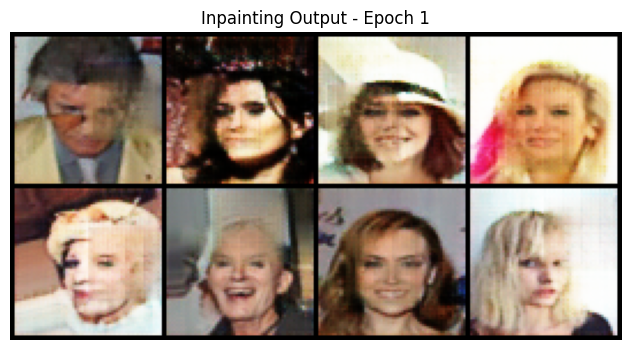

Epoch 2:   0%|          | 2/5087 [00:00<19:25,  4.36it/s]

[Epoch 2][Batch 0] Loss_D: 1.3434 | Loss_G: 1.2795


Epoch 2:   2%|▏         | 102/5087 [00:12<09:29,  8.75it/s]

[Epoch 2][Batch 100] Loss_D: 1.3068 | Loss_G: 1.2987


Epoch 2:   4%|▍         | 202/5087 [00:23<09:10,  8.87it/s]

[Epoch 2][Batch 200] Loss_D: 1.2676 | Loss_G: 1.5549


Epoch 2:   6%|▌         | 302/5087 [00:35<09:05,  8.77it/s]

[Epoch 2][Batch 300] Loss_D: 1.1944 | Loss_G: 1.3003


Epoch 2:   8%|▊         | 402/5087 [00:47<08:54,  8.77it/s]

[Epoch 2][Batch 400] Loss_D: 1.2481 | Loss_G: 1.3502


Epoch 2:  10%|▉         | 502/5087 [00:58<09:32,  8.00it/s]

[Epoch 2][Batch 500] Loss_D: 1.2064 | Loss_G: 1.3846


Epoch 2:  12%|█▏        | 602/5087 [01:10<08:23,  8.90it/s]

[Epoch 2][Batch 600] Loss_D: 1.2866 | Loss_G: 1.2766


Epoch 2:  14%|█▍        | 702/5087 [01:21<08:17,  8.82it/s]

[Epoch 2][Batch 700] Loss_D: 1.2613 | Loss_G: 1.4386


Epoch 2:  16%|█▌        | 802/5087 [01:33<08:07,  8.78it/s]

[Epoch 2][Batch 800] Loss_D: 1.2570 | Loss_G: 1.3921


Epoch 2:  18%|█▊        | 902/5087 [01:45<07:58,  8.75it/s]

[Epoch 2][Batch 900] Loss_D: 1.3559 | Loss_G: 1.3292


Epoch 2:  20%|█▉        | 1002/5087 [01:56<08:13,  8.27it/s]

[Epoch 2][Batch 1000] Loss_D: 1.3016 | Loss_G: 1.4180


Epoch 2:  22%|██▏       | 1102/5087 [02:08<08:08,  8.16it/s]

[Epoch 2][Batch 1100] Loss_D: 1.3232 | Loss_G: 1.4253


Epoch 2:  24%|██▎       | 1202/5087 [02:19<07:32,  8.58it/s]

[Epoch 2][Batch 1200] Loss_D: 1.3012 | Loss_G: 1.2802


Epoch 2:  26%|██▌       | 1302/5087 [02:31<07:04,  8.92it/s]

[Epoch 2][Batch 1300] Loss_D: 1.3035 | Loss_G: 1.3405


Epoch 2:  28%|██▊       | 1402/5087 [02:43<07:01,  8.75it/s]

[Epoch 2][Batch 1400] Loss_D: 1.2873 | Loss_G: 1.3473


Epoch 2:  30%|██▉       | 1502/5087 [02:55<06:49,  8.75it/s]

[Epoch 2][Batch 1500] Loss_D: 1.3291 | Loss_G: 1.2527


Epoch 2:  31%|███▏      | 1602/5087 [03:06<06:59,  8.30it/s]

[Epoch 2][Batch 1600] Loss_D: 1.3834 | Loss_G: 1.1978


Epoch 2:  33%|███▎      | 1702/5087 [03:18<06:40,  8.46it/s]

[Epoch 2][Batch 1700] Loss_D: 1.3360 | Loss_G: 1.3163


Epoch 2:  35%|███▌      | 1802/5087 [03:29<06:16,  8.73it/s]

[Epoch 2][Batch 1800] Loss_D: 1.4005 | Loss_G: 1.3551


Epoch 2:  37%|███▋      | 1902/5087 [03:41<05:59,  8.86it/s]

[Epoch 2][Batch 1900] Loss_D: 1.3222 | Loss_G: 1.2899


Epoch 2:  39%|███▉      | 2002/5087 [03:53<05:51,  8.79it/s]

[Epoch 2][Batch 2000] Loss_D: 1.3093 | Loss_G: 1.2399


Epoch 2:  41%|████▏     | 2102/5087 [04:04<05:43,  8.68it/s]

[Epoch 2][Batch 2100] Loss_D: 1.2934 | Loss_G: 1.4514


Epoch 2:  43%|████▎     | 2202/5087 [04:16<06:06,  7.87it/s]

[Epoch 2][Batch 2200] Loss_D: 1.2519 | Loss_G: 1.3332


Epoch 2:  45%|████▌     | 2302/5087 [04:27<05:18,  8.75it/s]

[Epoch 2][Batch 2300] Loss_D: 1.2940 | Loss_G: 1.3148


Epoch 2:  47%|████▋     | 2402/5087 [04:39<05:00,  8.92it/s]

[Epoch 2][Batch 2400] Loss_D: 1.2672 | Loss_G: 1.3772


Epoch 2:  49%|████▉     | 2502/5087 [04:51<04:55,  8.75it/s]

[Epoch 2][Batch 2500] Loss_D: 1.3240 | Loss_G: 1.3030


Epoch 2:  51%|█████     | 2602/5087 [05:02<04:43,  8.76it/s]

[Epoch 2][Batch 2600] Loss_D: 1.3590 | Loss_G: 1.2831


Epoch 2:  53%|█████▎    | 2702/5087 [05:14<04:41,  8.49it/s]

[Epoch 2][Batch 2700] Loss_D: 1.3311 | Loss_G: 1.2457


Epoch 2:  55%|█████▌    | 2802/5087 [05:25<04:43,  8.05it/s]

[Epoch 2][Batch 2800] Loss_D: 1.3207 | Loss_G: 1.3320


Epoch 2:  57%|█████▋    | 2902/5087 [05:37<04:11,  8.70it/s]

[Epoch 2][Batch 2900] Loss_D: 1.2827 | Loss_G: 1.3340


Epoch 2:  59%|█████▉    | 3002/5087 [05:49<03:58,  8.73it/s]

[Epoch 2][Batch 3000] Loss_D: 1.2994 | Loss_G: 1.3884


Epoch 2:  61%|██████    | 3102/5087 [06:00<03:45,  8.79it/s]

[Epoch 2][Batch 3100] Loss_D: 1.3135 | Loss_G: 1.3525


Epoch 2:  63%|██████▎   | 3202/5087 [06:12<03:35,  8.75it/s]

[Epoch 2][Batch 3200] Loss_D: 1.3492 | Loss_G: 1.4033


Epoch 2:  65%|██████▍   | 3302/5087 [06:24<03:30,  8.47it/s]

[Epoch 2][Batch 3300] Loss_D: 1.3081 | Loss_G: 1.2790


Epoch 2:  67%|██████▋   | 3402/5087 [06:35<03:23,  8.29it/s]

[Epoch 2][Batch 3400] Loss_D: 1.2978 | Loss_G: 1.4168


Epoch 2:  69%|██████▉   | 3502/5087 [06:47<03:01,  8.74it/s]

[Epoch 2][Batch 3500] Loss_D: 1.2722 | Loss_G: 1.3390


Epoch 2:  71%|███████   | 3602/5087 [06:59<02:48,  8.79it/s]

[Epoch 2][Batch 3600] Loss_D: 1.1598 | Loss_G: 1.5323


Epoch 2:  73%|███████▎  | 3702/5087 [07:10<02:39,  8.70it/s]

[Epoch 2][Batch 3700] Loss_D: 1.3622 | Loss_G: 1.4197


Epoch 2:  75%|███████▍  | 3802/5087 [07:22<02:23,  8.98it/s]

[Epoch 2][Batch 3800] Loss_D: 1.3666 | Loss_G: 1.2575


Epoch 2:  77%|███████▋  | 3902/5087 [07:33<02:25,  8.15it/s]

[Epoch 2][Batch 3900] Loss_D: 1.3421 | Loss_G: 1.2933


Epoch 2:  79%|███████▊  | 4002/5087 [07:45<02:08,  8.43it/s]

[Epoch 2][Batch 4000] Loss_D: 1.4283 | Loss_G: 1.0890


Epoch 2:  81%|████████  | 4102/5087 [07:56<01:50,  8.94it/s]

[Epoch 2][Batch 4100] Loss_D: 1.2654 | Loss_G: 1.1458


Epoch 2:  83%|████████▎ | 4202/5087 [08:08<01:42,  8.64it/s]

[Epoch 2][Batch 4200] Loss_D: 1.3312 | Loss_G: 1.2082


Epoch 2:  85%|████████▍ | 4302/5087 [08:20<01:29,  8.73it/s]

[Epoch 2][Batch 4300] Loss_D: 1.3540 | Loss_G: 1.2949


Epoch 2:  87%|████████▋ | 4402/5087 [08:31<01:17,  8.81it/s]

[Epoch 2][Batch 4400] Loss_D: 1.3399 | Loss_G: 1.2075


Epoch 2:  89%|████████▊ | 4502/5087 [08:43<01:13,  7.91it/s]

[Epoch 2][Batch 4500] Loss_D: 1.3349 | Loss_G: 1.3298


Epoch 2:  90%|█████████ | 4602/5087 [08:55<00:55,  8.74it/s]

[Epoch 2][Batch 4600] Loss_D: 1.1952 | Loss_G: 1.4402


Epoch 2:  92%|█████████▏| 4702/5087 [09:06<00:44,  8.62it/s]

[Epoch 2][Batch 4700] Loss_D: 1.2885 | Loss_G: 1.3344


Epoch 2:  94%|█████████▍| 4802/5087 [09:18<00:32,  8.81it/s]

[Epoch 2][Batch 4800] Loss_D: 1.2620 | Loss_G: 1.4170


Epoch 2:  96%|█████████▋| 4902/5087 [09:29<00:20,  8.91it/s]

[Epoch 2][Batch 4900] Loss_D: 1.3039 | Loss_G: 1.2115


Epoch 2:  98%|█████████▊| 5002/5087 [09:41<00:09,  8.57it/s]

[Epoch 2][Batch 5000] Loss_D: 1.2789 | Loss_G: 1.4282


Epoch 2: 100%|██████████| 5087/5087 [09:51<00:00,  8.60it/s]


 Epoch 2 Completed — Avg Loss_D: 1.3030 | Avg Loss_G: 1.3280


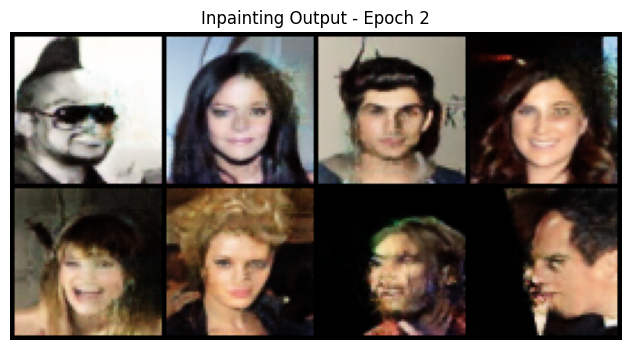

Epoch 3:   0%|          | 2/5087 [00:00<22:51,  3.71it/s]

[Epoch 3][Batch 0] Loss_D: 1.3769 | Loss_G: 1.3467


Epoch 3:   2%|▏         | 102/5087 [00:12<09:24,  8.83it/s]

[Epoch 3][Batch 100] Loss_D: 1.2428 | Loss_G: 1.3767


Epoch 3:   4%|▍         | 202/5087 [00:23<09:16,  8.77it/s]

[Epoch 3][Batch 200] Loss_D: 1.2341 | Loss_G: 1.3141


Epoch 3:   6%|▌         | 302/5087 [00:35<09:13,  8.65it/s]

[Epoch 3][Batch 300] Loss_D: 1.3124 | Loss_G: 1.2260


Epoch 3:   8%|▊         | 402/5087 [00:47<09:10,  8.50it/s]

[Epoch 3][Batch 400] Loss_D: 1.2900 | Loss_G: 1.3707


Epoch 3:  10%|▉         | 502/5087 [00:58<09:23,  8.13it/s]

[Epoch 3][Batch 500] Loss_D: 1.3506 | Loss_G: 1.2509


Epoch 3:  12%|█▏        | 602/5087 [01:10<08:44,  8.56it/s]

[Epoch 3][Batch 600] Loss_D: 1.4373 | Loss_G: 1.2236


Epoch 3:  14%|█▍        | 702/5087 [01:22<08:34,  8.52it/s]

[Epoch 3][Batch 700] Loss_D: 1.3024 | Loss_G: 1.3134


Epoch 3:  16%|█▌        | 802/5087 [01:33<08:08,  8.77it/s]

[Epoch 3][Batch 800] Loss_D: 1.2081 | Loss_G: 1.3591


Epoch 3:  18%|█▊        | 902/5087 [01:45<07:54,  8.81it/s]

[Epoch 3][Batch 900] Loss_D: 1.3279 | Loss_G: 1.3192


Epoch 3:  20%|█▉        | 1002/5087 [01:57<08:03,  8.44it/s]

[Epoch 3][Batch 1000] Loss_D: 1.2811 | Loss_G: 1.2336


Epoch 3:  22%|██▏       | 1102/5087 [02:08<08:19,  7.98it/s]

[Epoch 3][Batch 1100] Loss_D: 1.3411 | Loss_G: 1.2220


Epoch 3:  24%|██▎       | 1202/5087 [02:20<07:15,  8.91it/s]

[Epoch 3][Batch 1200] Loss_D: 1.2715 | Loss_G: 1.3440


Epoch 3:  26%|██▌       | 1302/5087 [02:32<07:07,  8.86it/s]

[Epoch 3][Batch 1300] Loss_D: 1.2806 | Loss_G: 1.2682


Epoch 3:  28%|██▊       | 1402/5087 [02:43<07:06,  8.64it/s]

[Epoch 3][Batch 1400] Loss_D: 1.3994 | Loss_G: 1.2748


Epoch 3:  30%|██▉       | 1502/5087 [02:55<06:45,  8.84it/s]

[Epoch 3][Batch 1500] Loss_D: 1.1565 | Loss_G: 1.4984


Epoch 3:  31%|███▏      | 1602/5087 [03:07<06:52,  8.45it/s]

[Epoch 3][Batch 1600] Loss_D: 1.3612 | Loss_G: 1.3246


Epoch 3:  33%|███▎      | 1702/5087 [03:18<06:41,  8.43it/s]

[Epoch 3][Batch 1700] Loss_D: 1.4771 | Loss_G: 1.3246


Epoch 3:  35%|███▌      | 1802/5087 [03:30<06:10,  8.86it/s]

[Epoch 3][Batch 1800] Loss_D: 1.2735 | Loss_G: 1.2725


Epoch 3:  37%|███▋      | 1902/5087 [03:42<05:57,  8.91it/s]

[Epoch 3][Batch 1900] Loss_D: 1.3773 | Loss_G: 1.2115


Epoch 3:  39%|███▉      | 2002/5087 [03:53<05:47,  8.88it/s]

[Epoch 3][Batch 2000] Loss_D: 1.3324 | Loss_G: 1.2356


Epoch 3:  41%|████▏     | 2102/5087 [04:05<05:51,  8.48it/s]

[Epoch 3][Batch 2100] Loss_D: 1.3095 | Loss_G: 1.3390


Epoch 3:  43%|████▎     | 2202/5087 [04:17<06:15,  7.68it/s]

[Epoch 3][Batch 2200] Loss_D: 1.1651 | Loss_G: 1.6775


Epoch 3:  45%|████▌     | 2302/5087 [04:28<05:17,  8.77it/s]

[Epoch 3][Batch 2300] Loss_D: 1.3367 | Loss_G: 1.2900


Epoch 3:  47%|████▋     | 2402/5087 [04:40<05:04,  8.81it/s]

[Epoch 3][Batch 2400] Loss_D: 1.4454 | Loss_G: 1.4229


Epoch 3:  49%|████▉     | 2502/5087 [04:52<04:55,  8.76it/s]

[Epoch 3][Batch 2500] Loss_D: 1.3366 | Loss_G: 1.3197


Epoch 3:  51%|█████     | 2602/5087 [05:03<04:42,  8.81it/s]

[Epoch 3][Batch 2600] Loss_D: 1.2086 | Loss_G: 1.4331


Epoch 3:  53%|█████▎    | 2702/5087 [05:15<04:50,  8.21it/s]

[Epoch 3][Batch 2700] Loss_D: 1.3349 | Loss_G: 1.3006


Epoch 3:  55%|█████▌    | 2802/5087 [05:27<04:30,  8.46it/s]

[Epoch 3][Batch 2800] Loss_D: 1.3724 | Loss_G: 1.2246


Epoch 3:  57%|█████▋    | 2902/5087 [05:38<04:14,  8.60it/s]

[Epoch 3][Batch 2900] Loss_D: 1.3860 | Loss_G: 1.2937


Epoch 3:  59%|█████▉    | 3002/5087 [05:50<04:00,  8.66it/s]

[Epoch 3][Batch 3000] Loss_D: 1.3929 | Loss_G: 1.1708


Epoch 3:  61%|██████    | 3102/5087 [06:02<03:47,  8.73it/s]

[Epoch 3][Batch 3100] Loss_D: 1.3180 | Loss_G: 1.1821


Epoch 3:  63%|██████▎   | 3202/5087 [06:13<03:35,  8.74it/s]

[Epoch 3][Batch 3200] Loss_D: 1.3257 | Loss_G: 1.2169


Epoch 3:  65%|██████▍   | 3302/5087 [06:25<03:37,  8.21it/s]

[Epoch 3][Batch 3300] Loss_D: 1.2655 | Loss_G: 1.2414


Epoch 3:  67%|██████▋   | 3402/5087 [06:37<03:11,  8.79it/s]

[Epoch 3][Batch 3400] Loss_D: 1.3476 | Loss_G: 1.2703


Epoch 3:  69%|██████▉   | 3502/5087 [06:48<03:01,  8.74it/s]

[Epoch 3][Batch 3500] Loss_D: 1.3568 | Loss_G: 1.2895


Epoch 3:  71%|███████   | 3602/5087 [07:00<02:51,  8.64it/s]

[Epoch 3][Batch 3600] Loss_D: 1.3984 | Loss_G: 1.2510


Epoch 3:  73%|███████▎  | 3702/5087 [07:12<02:36,  8.83it/s]

[Epoch 3][Batch 3700] Loss_D: 1.3060 | Loss_G: 1.2647


Epoch 3:  75%|███████▍  | 3802/5087 [07:24<02:40,  8.02it/s]

[Epoch 3][Batch 3800] Loss_D: 1.2679 | Loss_G: 1.3880


Epoch 3:  77%|███████▋  | 3902/5087 [07:35<02:26,  8.11it/s]

[Epoch 3][Batch 3900] Loss_D: 1.3567 | Loss_G: 1.1881


Epoch 3:  79%|███████▊  | 4002/5087 [07:47<02:03,  8.82it/s]

[Epoch 3][Batch 4000] Loss_D: 1.3661 | Loss_G: 1.3425


Epoch 3:  81%|████████  | 4102/5087 [07:59<01:54,  8.64it/s]

[Epoch 3][Batch 4100] Loss_D: 1.3329 | Loss_G: 1.2336


Epoch 3:  83%|████████▎ | 4202/5087 [08:10<01:40,  8.85it/s]

[Epoch 3][Batch 4200] Loss_D: 1.2516 | Loss_G: 1.3898


Epoch 3:  85%|████████▍ | 4302/5087 [08:22<01:31,  8.60it/s]

[Epoch 3][Batch 4300] Loss_D: 1.1795 | Loss_G: 1.3409


Epoch 3:  87%|████████▋ | 4402/5087 [08:34<01:26,  7.90it/s]

[Epoch 3][Batch 4400] Loss_D: 1.3004 | Loss_G: 1.3878


Epoch 3:  89%|████████▊ | 4502/5087 [08:45<01:06,  8.82it/s]

[Epoch 3][Batch 4500] Loss_D: 1.2663 | Loss_G: 1.4832


Epoch 3:  90%|█████████ | 4602/5087 [08:57<00:55,  8.78it/s]

[Epoch 3][Batch 4600] Loss_D: 1.3007 | Loss_G: 1.2487


Epoch 3:  92%|█████████▏| 4702/5087 [09:09<00:45,  8.55it/s]

[Epoch 3][Batch 4700] Loss_D: 1.3032 | Loss_G: 1.2546


Epoch 3:  94%|█████████▍| 4802/5087 [09:20<00:33,  8.63it/s]

[Epoch 3][Batch 4800] Loss_D: 1.2741 | Loss_G: 1.3385


Epoch 3:  96%|█████████▋| 4902/5087 [09:32<00:21,  8.63it/s]

[Epoch 3][Batch 4900] Loss_D: 1.2775 | Loss_G: 1.2756


Epoch 3:  98%|█████████▊| 5002/5087 [09:44<00:10,  8.20it/s]

[Epoch 3][Batch 5000] Loss_D: 1.3704 | Loss_G: 1.1781


Epoch 3: 100%|██████████| 5087/5087 [09:54<00:00,  8.56it/s]


 Epoch 3 Completed — Avg Loss_D: 1.3211 | Avg Loss_G: 1.2980


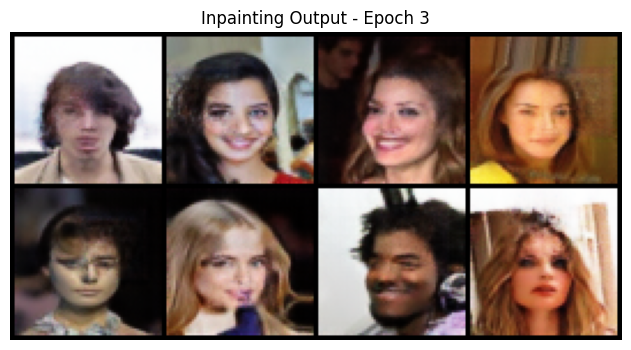

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
netG = UNetInpaintGenerator().to(device)
netD = InpaintingDiscriminator().to(device)


optimizerG = optim.Adam(netG.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=0.0001, betas=(0.5, 0.999))


criterion_GAN = nn.BCELoss()
criterion_L1 = nn.L1Loss()
lambda_L1 = 10
lambda_LPIPS = 0.1
real_label = 1.0
fake_label = 0.0

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

img_dir = '/content/img_align_celeba/img_align_celeba/img_align_celeba'

inpaint_train_dataset = InpaintingCelebADataset(train_df, img_dir, transform)
inpaint_train_loader = DataLoader(inpaint_train_dataset, batch_size=32, shuffle=True, num_workers=2)

num_epochs = 3

for epoch in range(num_epochs):
    netG.train()
    netD.train()
    total_loss_D, total_loss_G = 0.0, 0.0

    for i, (masked_imgs, masks, originals) in enumerate(tqdm(inpaint_train_loader, desc=f"Epoch {epoch+1}")):
        masked_imgs = masked_imgs.to(device)
        masks = masks.to(device)
        originals = originals.to(device)

        masked_imgs = masked_imgs * 2 - 1
        originals = originals * 2 - 1

        input_tensor = torch.cat((masked_imgs, masks), dim=1)

        b_size = masked_imgs.size(0)
        netD.zero_grad()
        label_real = torch.full((b_size,), real_label, device=device)
        output_real = netD(originals)
        loss_D_real = criterion_GAN(output_real, label_real)

        fake_images = netG(input_tensor)
        label_fake = torch.full((b_size,), fake_label, device=device)
        output_fake = netD(fake_images.detach())
        loss_D_fake = criterion_GAN(output_fake, label_fake)

        loss_D = loss_D_real + loss_D_fake
        loss_D.backward()
        optimizerD.step()

        netG.zero_grad()
        output_fake_for_G = netD(fake_images)
        loss_G_adv = criterion_GAN(output_fake_for_G, label_real)

        loss_G_L1 = criterion_L1(fake_images * masks, originals * masks)
        loss_G_lpips = lpips_loss_fn(fake_images, originals).mean()

        loss_G = loss_G_adv + lambda_L1 * loss_G_L1 + lambda_LPIPS * loss_G_lpips
        loss_G.backward()
        optimizerG.step()

        total_loss_D += loss_D.item() * b_size
        total_loss_G += loss_G.item() * b_size

        if i % 100 == 0:
            print(f"[Epoch {epoch+1}][Batch {i}] Loss_D: {loss_D.item():.4f} | Loss_G: {loss_G.item():.4f}")

    print(f" Epoch {epoch+1} Completed — Avg Loss_D: {total_loss_D/len(inpaint_train_dataset):.4f} | Avg Loss_G: {total_loss_G/len(inpaint_train_dataset):.4f}")

    torch.save(netG.state_dict(), f"netG_epoch{epoch+1}.pth")

    netG.eval()
    with torch.no_grad():
        masked_batch, mask_batch, orig_batch = next(iter(inpaint_train_loader))
        masked_batch = masked_batch.to(device) * 2 - 1
        mask_batch = mask_batch.to(device)
        vis_input = torch.cat((masked_batch[:8], mask_batch[:8]), dim=1)
        output = netG(vis_input).cpu()
        grid = torchvision.utils.make_grid(output, nrow=4, normalize=True)
        plt.figure(figsize=(8, 4))
        plt.imshow(grid.permute(1, 2, 0))
        plt.title(f"Inpainting Output - Epoch {epoch+1}")
        plt.axis('off')
        plt.show()


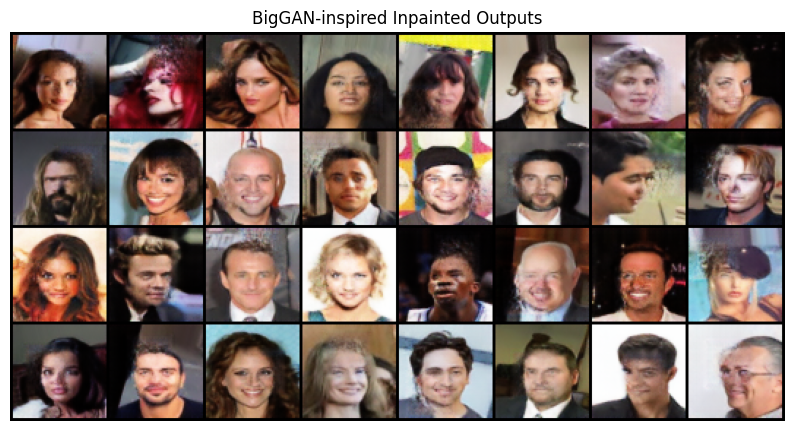

In [ ]:
netG.eval()
with torch.no_grad():
    fixed_masked, masks, _ = next(iter(inpaint_train_loader))
    fixed_masked = fixed_masked.to(device)
    masks = masks.to(device)
    fixed_masked = fixed_masked * 2 - 1
    input_tensor = torch.cat((fixed_masked, masks), dim=1)

    inpainted = netG(input_tensor).cpu()

import torchvision
import matplotlib.pyplot as plt

grid = torchvision.utils.make_grid(inpainted, nrow=8, padding=2, normalize=True)
plt.figure(figsize=(10, 6))
plt.imshow(grid.permute(1, 2, 0))
plt.title("BigGAN-inspired Inpainted Outputs")
plt.axis("off")
plt.show()

In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()
    l1_loss = nn.L1Loss()
    total_l1, total_psnr, total_ssim = 0.0, 0.0, 0.0
    total_samples = 0

    with torch.no_grad():
        for masked_imgs, masks, originals in tqdm(dataloader, desc="Evaluating"):
            masked_imgs = masked_imgs.to(device)
            masks = masks.to(device)
            originals = originals.to(device)

            masked_imgs = masked_imgs * 2 - 1
            originals_01 = originals
            input_tensor = torch.cat((masked_imgs, masks), dim=1)

            preds = model(input_tensor)
            preds_01 = (preds + 1) / 2

            loss = l1_loss(preds_01, originals_01)
            total_l1 += loss.item() * masked_imgs.size(0)

            total_psnr += peak_signal_noise_ratio(preds_01, originals_01, data_range=1.0) * masked_imgs.size(0)
            total_ssim += structural_similarity_index_measure(preds_01, originals_01, data_range=1.0) * masked_imgs.size(0)
            total_samples += masked_imgs.size(0)

    avg_l1 = total_l1 / total_samples
    avg_psnr = total_psnr / total_samples
    avg_ssim = total_ssim / total_samples

    return avg_l1, avg_psnr, avg_ssim

In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()
    l1_loss = nn.L1Loss()
    total_l1, total_psnr, total_ssim = 0.0, 0.0, 0.0
    total_samples = 0

    with torch.no_grad():
        for masked_imgs, masks, originals in tqdm(dataloader, desc="Evaluating"):
            masked_imgs = masked_imgs.to(device)
            masks = masks.to(device)
            originals = originals.to(device)

            masked_imgs = masked_imgs * 2 - 1
            originals_01 = originals
            input_tensor = torch.cat((masked_imgs, masks), dim=1)

            preds = model(input_tensor)
            preds_01 = (preds + 1) / 2

            loss = l1_loss(preds_01, originals_01)
            total_l1 += loss.item() * masked_imgs.size(0)
            total_psnr += peak_signal_noise_ratio(preds_01, originals_01, data_range=1.0).item() * masked_imgs.size(0)
            total_ssim += structural_similarity_index_measure(preds_01, originals_01, data_range=1.0).item() * masked_imgs.size(0)

            total_samples += masked_imgs.size(0)

    avg_l1 = total_l1 / total_samples
    avg_psnr = total_psnr / total_samples
    avg_ssim = total_ssim / total_samples

    return avg_l1, avg_psnr, avg_ssim

In [ ]:
!pip install -U torchmetrics --quiet
from torchmetrics.functional.image.psnr import peak_signal_noise_ratio
from torchmetrics.functional.image.ssim import structural_similarity_index_measure

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 51.3 MB/s eta 0:00:00


In [ ]:
torch.save(netG.state_dict(), "netG_final.pth")
avg_l1, avg_psnr, avg_ssim = evaluate_model(netG, test_loader, device)

print("\n Final Evaluation Metrics:")
print(f"    L1 Loss : {avg_l1 :.4f}")
print(f"    PSNR    : {avg_psnr :.2f} dB")
print(f"    SSIM    : {avg_ssim :.4f}")

Evaluating: 100%|██████████| 624/624 [03:19<00:00,  3.12it/s]


 Final Evaluation Metrics:
    L1 Loss : 0.3581
    PSNR    : 29.57 dB
    SSIM    : 0.6590


DL_final work

We used the CelebFaces Attributes Dataset (CelebA), which contains 202,599 celebrity face images. Each image is annotated with 40 binary attributes, has identity labels for 10,177 individuals, and includes 5 facial landmark coordinates. We extracted the aligned and cropped images from the Google Drive folder.

**Aim:**  
Our goal was to explore and preprocess the dataset thoroughly, develop a GAN-based image inpainting model that reconstructs masked regions, and evaluate the performance using meaningful metrics (L1 loss, PSNR, SSIM). We also generated several plots to analyze the model’s performance and answer the homework questions directly based on my outputs.


In [ ]:
import pandas as pd
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch

We began by mounting my Google Drive to access the dataset files. We then unzipped the aligned-cropped images into a folder. This consists of all images for processing.

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!ls -l "/content/drive/MyDrive/CelebA"


total 12
drwx------ 2 root root 4096 Apr  3 18:02 Anno
drwx------ 2 root root 4096 Apr  3 19:25 Eval
drwx------ 2 root root 4096 Apr  3 17:39 Img


In [ ]:

!cp '/content/drive/MyDrive/img_align_celeba.zip' .
!unzip -o img_align_celeba.zip -d img_align_celeba
!ls -l img_align_celeba | head -n 10

!find img_align_celeba -type f | wc -l


Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/img_align_celeba/197603.jpg  
 extracting: img_align_celeba/img_align_celeba/197604.jpg  
 extracting: img_align_celeba/img_align_celeba/197605.jpg  
 extracting: img_align_celeba/img_align_celeba/197606.jpg  
 extracting: img_align_celeba/img_align_celeba/197607.jpg  
 extracting: img_align_celeba/img_align_celeba/197608.jpg  
 extracting: img_align_celeba/img_align_celeba/197609.jpg  
 extracting: img_align_celeba/img_align_celeba/197610.jpg  
 extracting: img_align_celeba/img_align_celeba/197611.jpg  
 extracting: img_align_celeba/img_align_celeba/197612.jpg  
 extracting: img_align_celeba/img_align_celeba/197613.jpg  
 extracting: img_align_celeba/img_align_celeba/197614.jpg  
 extracting: img_align_celeba/img_align_celeba/197615.jpg  
 extracting: img_align_celeba/img_align_celeba/197616.jpg  
 extracting: img_align_celeba/img_align_celeba/197617.jpg  
 extracting: img_align_celeba/img_align_celeba/19

This confirmed that the images were successfully extracted. This step laid the foundation for all further processing.

## Step 1: Data Exploration and Preprocessing


Next, we loaded the attribute file to extract the number of images and the attribute names. we read the first two lines to capture that there are 202,599 images and a list of 40 attributes. Then, we merged this information with the evaluation partitions to split the dataset correctly.


In [ ]:
attr_file_path = '/content/drive/MyDrive/CelebA/Anno/list_attr_celeba.txt'
eval_file_path = '/content/drive/MyDrive/CelebA/Eval/list_eval_partition.txt'
img_dir = '/content/img_align_celeba/img_align_celeba'


with open(attr_file_path, 'r') as f:
    lines = f.read().strip().split('\n')

num_images = int(lines[0])
attribute_names = lines[1].split()

print("Number of images (from attribute file):", num_images)
print("Attribute names:", attribute_names)

Number of images (from attribute file): 202599
Attribute names: ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


This ensured that We correctly partitioned the dataset based on the official splits.


In [ ]:
import pandas as pd

print("First 5 lines of the attribute file:")
for line in lines[:5]:
    print(line.strip())

df_attr = pd.read_csv(attr_file_path, delim_whitespace=True, skiprows=2)
print("\nShape of the attributes dataframe:", df_attr.shape)
df_attr.head(5)


First 5 lines of the attribute file:
202599
5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young
000001.jpg -1  1  1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1  1  1 -1  1 -1 -1  1 -1 -1  1 -1 -1 -1  1  1 -1  1 -1  1 -1 -1  1
000002.jpg -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1 -1  1 -1 -1  1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1
000003.jpg -1 -1 -1 -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1  1  1 -1 -1  1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1  1


<ipython-input-9-ffa900118800>:9: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_attr = pd.read_csv(attr_file_path, delim_whitespace=True, skiprows=2)



Shape of the attributes dataframe: (202598, 41)


,000001.jpg,-1,1,1.1,-1.1,-1.2,-1.3,-1.4,-1.5,-1.6,...,-1.22,1.8,1.9,-1.23,1.10,-1.24,1.11,-1.25,-1.26,1.12
0,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
1,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
2,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
3,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
4,000006.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,1,-1,1,-1,-1,1


The output provided the mean, standard deviation, and quartiles for each attribute. For example, “5_o_Clock_Shadow” had a mean around –0.7777 (before conversion), confirming that most values were negative.

In [ ]:
import os
import glob
df_attr = pd.read_csv(attr_file_path, sep='\s+', skiprows=2, header=None)
df_attr.columns = ['image_id'] + attribute_names


In [ ]:
df_partition = pd.read_csv(eval_file_path, sep='\s+', header=None, names=['image_id', 'partition'])
df_merged = pd.merge(df_attr, df_partition, on='image_id', how='inner')
for attr in attribute_names:
    df_merged[attr] = df_merged[attr].apply(lambda x: 0 if x == -1 else 1)

train_df = df_merged[df_merged['partition'] == 0].reset_index(drop=True)
val_df   = df_merged[df_merged['partition'] == 1].reset_index(drop=True)
test_df  = df_merged[df_merged['partition'] == 2].reset_index(drop=True)

print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))
print("Test samples:", len(test_df))

Training samples: 162770
Validation samples: 19867
Test samples: 19962


In [ ]:

print("Descriptive Statistics for Attribute Labels:")
print(df_attr.describe())

missing_values = df_attr.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)


Descriptive Statistics for Attribute Labels:
       5_o_Clock_Shadow  Arched_Eyebrows    Attractive  Bags_Under_Eyes  \
count     202599.000000    202599.000000  202599.00000    202599.000000   
mean          -0.777728        -0.466039       0.02501        -0.590857   
std            0.628602         0.884766       0.99969         0.806778   
min           -1.000000        -1.000000      -1.00000        -1.000000   
25%           -1.000000        -1.000000      -1.00000        -1.000000   
50%           -1.000000        -1.000000       1.00000        -1.000000   
75%           -1.000000         1.000000       1.00000        -1.000000   
max            1.000000         1.000000       1.00000         1.000000   

                Bald          Bangs       Big_Lips       Big_Nose  \
count  202599.000000  202599.000000  202599.000000  202599.000000   
mean       -0.955113      -0.696849      -0.518408      -0.530935   
std         0.296241       0.717219       0.855135       0.847414   
min

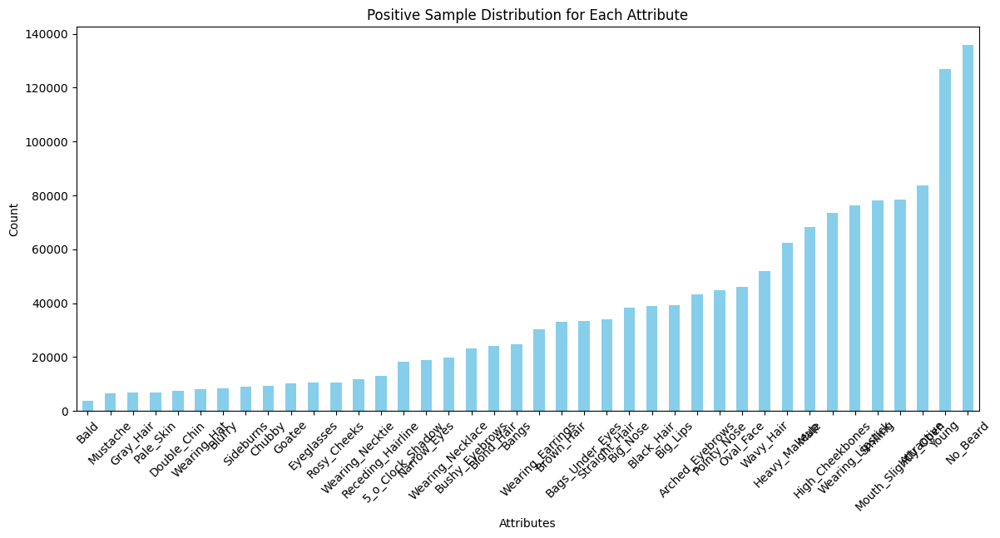

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
positive_counts = train_df[attribute_names].sum(axis=0)
plt.figure(figsize=(14, 6))
positive_counts.sort_values().plot(kind='bar', color='skyblue')
plt.title('Positive Sample Distribution for Each Attribute')
plt.xlabel('Attributes')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

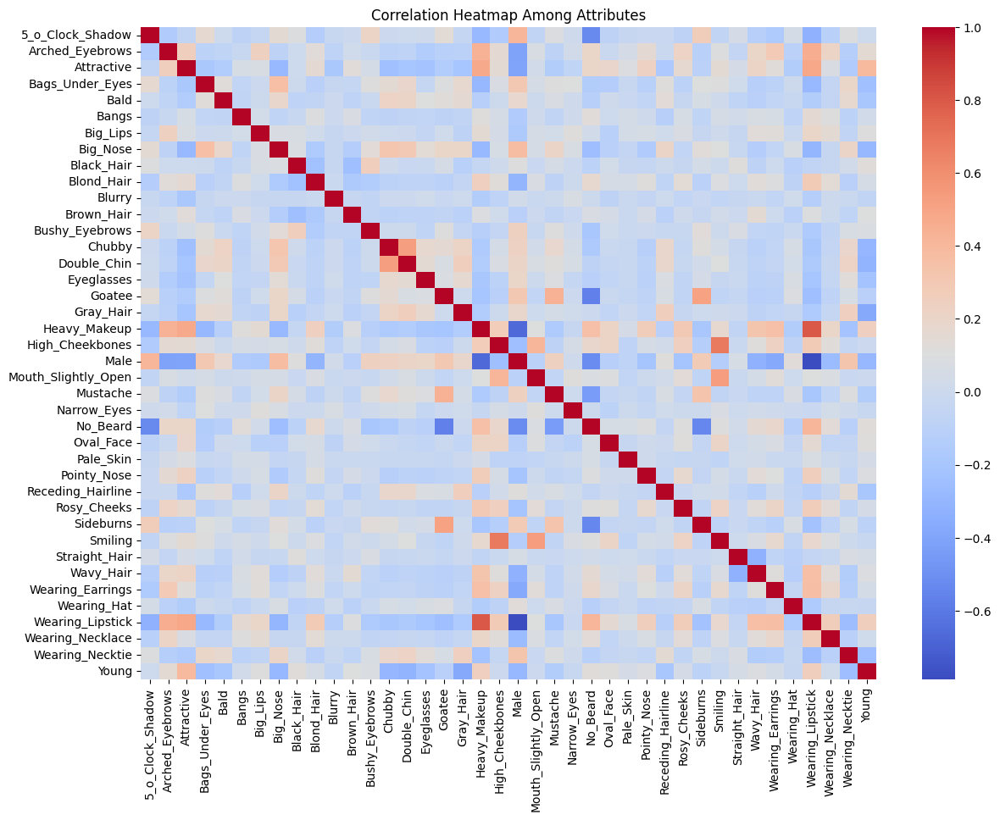

In [ ]:
plt.figure(figsize=(14, 10))
corr_matrix = train_df[attribute_names].corr()
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap Among Attributes')
plt.show()

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

class CelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None, attr_names=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.attr_names = attr_names
        available_indices = []
        for i in range(len(self.df)):
            img_path = os.path.join(self.img_dir, self.df.iloc[i]['image_id'])
            if os.path.exists(img_path):
                available_indices.append(i)
            else:
                print(f"Warning: File {img_path} not found. Skipping this sample.")
        self.df = self.df.iloc[available_indices].reset_index(drop=True)
        print(f"Filtered dataset: {len(self.df)} samples available.")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row['image_id']
        img_path = os.path.join(self.img_dir, img_name)
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
            image = Image.new('RGB', (224, 224), (0, 0, 0))
        if self.transform:
            image = self.transform(image)
        labels = row[self.attr_names].values.astype('float32')
        return image, labels
train_dataset = CelebADataset(train_df, img_dir, transform, attr_names=attribute_names)
val_dataset   = CelebADataset(val_df,   img_dir, transform, attr_names=attribute_names)
test_dataset  = CelebADataset(test_df,  img_dir, transform, attr_names=attribute_names)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

print("Number of training samples in dataset:", len(train_dataset))
print("Number of validation samples in dataset:", len(val_dataset))
print("Number of test samples in dataset:", len(test_dataset))

Filtered dataset: 162770 samples available.
Filtered dataset: 19867 samples available.
Filtered dataset: 19962 samples available.
Number of training samples in dataset: 162770
Number of validation samples in dataset: 19867
Number of test samples in dataset: 19962


In [ ]:
!ls -l "/content/img_align_celeba/img_align_celeba" | head -n 10


total 1737936
-rw-r--r-- 1 root root 11440 Sep 28  2015 000001.jpg
-rw-r--r-- 1 root root  7448 Sep 28  2015 000002.jpg
-rw-r--r-- 1 root root  4253 Sep 28  2015 000003.jpg
-rw-r--r-- 1 root root 10747 Sep 28  2015 000004.jpg
-rw-r--r-- 1 root root  6351 Sep 28  2015 000005.jpg
-rw-r--r-- 1 root root  8073 Sep 28  2015 000006.jpg
-rw-r--r-- 1 root root  8203 Sep 28  2015 000007.jpg
-rw-r--r-- 1 root root  7725 Sep 28  2015 000008.jpg
-rw-r--r-- 1 root root  8641 Sep 28  2015 000009.jpg


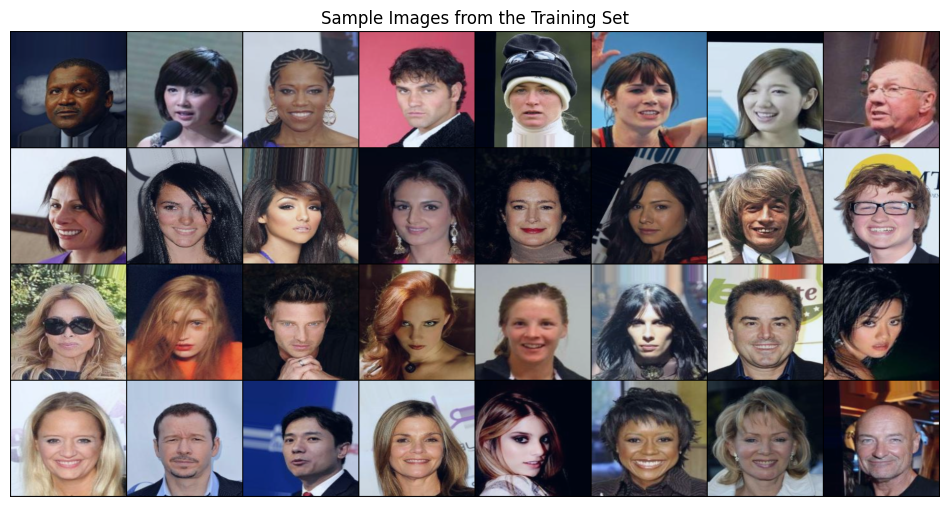

In [ ]:
import matplotlib.pyplot as plt
import torchvision

data_iter = iter(train_loader)
images, labels = next(data_iter)

grid_img = torchvision.utils.make_grid(images, nrow=8, normalize=True)

plt.figure(figsize=(12, 12))
plt.imshow(grid_img.permute(1, 2, 0))
plt.title("Sample Images from the Training Set")
plt.axis("off")
plt.show()



In [ ]:

print("Attribute labels for the first 5 images:")
for i in range(5):
    print(f"Image {i+1}:")
    label_dict = {attr: int(labels[i][j].item()) for j, attr in enumerate(attribute_names)}
    print(label_dict)


Attribute labels for the first 5 images:
Image 1:
{'5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 0, 'Attractive': 0, 'Bags_Under_Eyes': 1, 'Bald': 0, 'Bangs': 0, 'Big_Lips': 0, 'Big_Nose': 1, 'Black_Hair': 0, 'Blond_Hair': 0, 'Blurry': 0, 'Brown_Hair': 0, 'Bushy_Eyebrows': 0, 'Chubby': 0, 'Double_Chin': 0, 'Eyeglasses': 0, 'Goatee': 0, 'Gray_Hair': 0, 'Heavy_Makeup': 0, 'High_Cheekbones': 1, 'Male': 1, 'Mouth_Slightly_Open': 0, 'Mustache': 1, 'Narrow_Eyes': 0, 'No_Beard': 0, 'Oval_Face': 1, 'Pale_Skin': 0, 'Pointy_Nose': 0, 'Receding_Hairline': 0, 'Rosy_Cheeks': 0, 'Sideburns': 0, 'Smiling': 0, 'Straight_Hair': 0, 'Wavy_Hair': 0, 'Wearing_Earrings': 0, 'Wearing_Hat': 0, 'Wearing_Lipstick': 0, 'Wearing_Necklace': 0, 'Wearing_Necktie': 0, 'Young': 0}
Image 2:
{'5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 0, 'Attractive': 0, 'Bags_Under_Eyes': 1, 'Bald': 0, 'Bangs': 1, 'Big_Lips': 1, 'Big_Nose': 0, 'Black_Hair': 1, 'Blond_Hair': 0, 'Blurry': 0, 'Brown_Hair': 0, 'Bushy_Eyebrows': 0, 'Chubby': 0, 

### Custom Dataset with Random Masking

For the inpainting task, We needed to simulate missing regions in the images. We created a function to apply a random square mask and built a custom dataset class that returns the masked image, the binary mask, and the original image.


In [ ]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import os

import torch

def add_random_mask(image, mask_size=56):

    _, H, W = image.shape
    top = torch.randint(low=0, high=H - mask_size + 1, size=(1,)).item()
    left = torch.randint(low=0, high=W - mask_size + 1, size=(1,)).item()

    masked_image = image.clone()
    mask = torch.zeros_like(image)

    mask[:, top:top+mask_size, left:left+mask_size] = 1.0
    masked_image[:, top:top+mask_size, left:left+mask_size] = 0.0
    return masked_image, mask


class InpaintingCelebADataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row['image_id']
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        masked_image, mask = add_random_mask(image, mask_size=56)
        return masked_image, mask, image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
img_dir = '/content/img_align_celeba/img_align_celeba'

inpaint_train_dataset = InpaintingCelebADataset(train_df, img_dir, transform)
inpaint_train_loader = torch.utils.data.DataLoader(inpaint_train_dataset, batch_size=32, shuffle=True, num_workers=2)
print("Inpainting training samples:", len(inpaint_train_dataset))


Inpainting training samples: 162770


The dataset confirmed that 162,770 training samples were available. This step is critical because it ensures that each image is processed and masked properly, making the inpainting task realistic.

### Visual Inspection of the Preprocessed Data

I then visualized a few examples to verify that the random masks were applied correctly. The grid displays the masked images, binary masks, original images, and the absolute difference images.

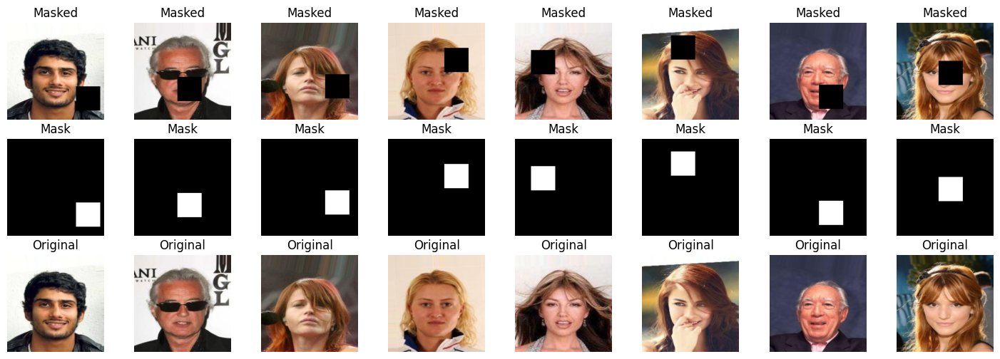

In [ ]:
import matplotlib.pyplot as plt
import torchvision
data_iter = iter(inpaint_train_loader)
masked_imgs, masks, originals = next(data_iter)
num_samples = 8
plt.figure(figsize=(18, 6))
for i in range(num_samples):
    plt.subplot(3, num_samples, i+1)
    plt.imshow(masked_imgs[i].permute(1, 2, 0))
    plt.title("Masked")
    plt.axis("off")

    plt.subplot(3, num_samples, num_samples+i+1)
    plt.imshow(masks[i][0], cmap='gray')
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(3, num_samples, 2*num_samples+i+1)
    plt.imshow(originals[i].permute(1, 2, 0))
    plt.title("Original")
    plt.axis("off")
plt.show()


The visual grid confirmed that the random masks are correctly applied. The “Difference” images clearly show the regions where pixels were removed, validating that the masking function works as intended.

# GAN Model Construction

### Inpainting Generator

We built an encoder-decoder generator that downsamples the input masked image and reconstructs the complete image. The final Tanh activation scales the output to the range [-1,1].

In [ ]:
import torch
import torch.nn as nn

class ResBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
        )
    def forward(self, x):
        return nn.ReLU(inplace=True)(x + self.block(x))

class UNetGenerator(nn.Module):
    def __init__(self, in_ch=3, out_ch=3, base=64):
        super().__init__()
        self.down1 = nn.Sequential(nn.Conv2d(in_ch, base, 4, 2, 1), nn.ReLU(True))
        self.down2 = nn.Sequential(nn.Conv2d(base, base*2, 4, 2, 1),
                                   nn.BatchNorm2d(base*2), nn.ReLU(True))
        self.down3 = nn.Sequential(nn.Conv2d(base*2, base*4, 4, 2, 1),
                                   nn.BatchNorm2d(base*4), nn.ReLU(True))
        self.down4 = nn.Sequential(nn.Conv2d(base*4, base*8, 4, 2, 1),
                                   nn.BatchNorm2d(base*8), nn.ReLU(True))

        self.resblocks = nn.Sequential(*[ResBlock(base*8) for _ in range(4)])

        self.up1 = nn.Sequential(nn.ConvTranspose2d(base*8, base*4, 4, 2, 1),
                                 nn.BatchNorm2d(base*4), nn.ReLU(True))
        self.up2 = nn.Sequential(nn.ConvTranspose2d(base*8, base*2, 4, 2, 1),
                                 nn.BatchNorm2d(base*2), nn.ReLU(True))
        self.up3 = nn.Sequential(nn.ConvTranspose2d(base*4, base,   4, 2, 1),
                                 nn.BatchNorm2d(base),   nn.ReLU(True))
        self.up4 = nn.Sequential(nn.ConvTranspose2d(base*2, out_ch, 4, 2, 1),
                                 nn.Tanh())

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)

        r = self.resblocks(d4)

        u1 = self.up1(r)
        u1 = torch.cat([u1, d3], 1)

        u2 = self.up2(u1)
        u2 = torch.cat([u2, d2], 1)

        u3 = self.up3(u2)
        u3 = torch.cat([u3, d1], 1)

        u4 = self.up4(u3)
        return u4

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
netG = UNetGenerator().to(device)
print("Inpainting Generator Architecture:\n", netG)



Inpainting Generator Architecture:
 UNetGenerator(
  (down1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (down2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (down3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (down4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (resblocks): Sequential(
    (0): ResBlock(
      (block): Sequential(
        (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
 

### Inpainting Discriminator

We created a discriminator that processes the entire image and produces a single probability using adaptive average pooling.

In [ ]:
import torch.nn as nn

class PatchDiscriminator(nn.Module):
    def __init__(self, in_ch=3, base=64):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_ch,    base,   4, 2, 1), nn.LeakyReLU(0.2, True),
            nn.Conv2d(base,     base*2, 4, 2, 1), nn.BatchNorm2d(base*2),
                                                   nn.LeakyReLU(0.2, True),
            nn.Conv2d(base*2,   base*4, 4, 2, 1), nn.BatchNorm2d(base*4),
                                                   nn.LeakyReLU(0.2, True),
            nn.Conv2d(base*4,   base*8, 4, 1, 1), nn.BatchNorm2d(base*8),
                                                   nn.LeakyReLU(0.2, True),
            nn.Conv2d(base*8,   1,      4, 1, 1), nn.Sigmoid()
        )
    def forward(self, x):
        return self.model(x)

netD = PatchDiscriminator().to(device)
print("Inpainting Discriminator Architecture:\n", netD)


Inpainting Discriminator Architecture:
 PatchDiscriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (12): Sigmoid()
  )
)


# GAN Training

### Training Loop

We then set up the training loop. we used Binary Cross-Entropy (BCE) loss for the adversarial part and L1 loss for reconstruction, with a weight (lambda_L1) of 10. The training log shows batch losses and average losses per epoch. F

Epoch[1/5] Batch[0] LossD: 0.6732  LossG: 2.2178
Epoch[1/5] Batch[200] LossD: 0.7477  LossG: 1.3372
Epoch[1/5] Batch[400] LossD: 0.2601  LossG: 3.5615
Epoch[1/5] Batch[600] LossD: 0.6346  LossG: 2.0691
Epoch[1/5] Batch[800] LossD: 0.5705  LossG: 1.5759
Epoch[1/5] Batch[1000] LossD: 0.4164  LossG: 2.2078
Epoch[1/5] Batch[1200] LossD: 0.0355  LossG: 4.2282
Epoch[1/5] Batch[1400] LossD: 0.5542  LossG: 3.1241
Epoch[1/5] Batch[1600] LossD: 0.0191  LossG: 5.3377
Epoch[1/5] Batch[1800] LossD: 0.7121  LossG: 4.3934
Epoch[1/5] Batch[2000] LossD: 0.0190  LossG: 4.8937
Epoch[1/5] Batch[2200] LossD: 0.0026  LossG: 8.9028
Epoch[1/5] Batch[2400] LossD: 0.5632  LossG: 1.9587
Epoch[1/5] Batch[2600] LossD: 0.4327  LossG: 2.4820
Epoch[1/5] Batch[2800] LossD: 0.8517  LossG: 2.0565
Epoch[1/5] Batch[3000] LossD: 1.6868  LossG: 2.4916
Epoch[1/5] Batch[3200] LossD: 0.0442  LossG: 4.1605
Epoch[1/5] Batch[3400] LossD: 0.5952  LossG: 2.9208
Epoch[1/5] Batch[3600] LossD: 0.4414  LossG: 2.7363
Epoch[1/5] Batch[38

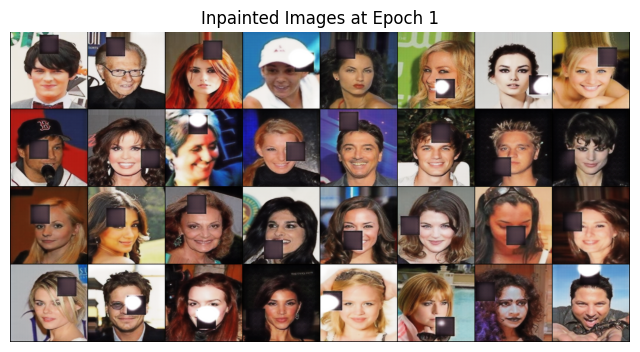

Epoch[2/5] Batch[0] LossD: 0.1518  LossG: 2.9842
Epoch[2/5] Batch[200] LossD: 0.0710  LossG: 4.1200
Epoch[2/5] Batch[400] LossD: 0.4921  LossG: 4.8712
Epoch[2/5] Batch[600] LossD: 0.0881  LossG: 3.7592
Epoch[2/5] Batch[800] LossD: 0.3629  LossG: 4.3718
Epoch[2/5] Batch[1000] LossD: 0.1850  LossG: 4.7157
Epoch[2/5] Batch[1200] LossD: 0.1870  LossG: 3.4889
Epoch[2/5] Batch[1400] LossD: 0.3593  LossG: 2.1748
Epoch[2/5] Batch[1600] LossD: 0.3983  LossG: 1.8210
Epoch[2/5] Batch[1800] LossD: 0.6343  LossG: 4.9538
Epoch[2/5] Batch[2000] LossD: 0.5285  LossG: 3.1939
Epoch[2/5] Batch[2200] LossD: 0.1467  LossG: 3.7989
Epoch[2/5] Batch[2400] LossD: 0.5445  LossG: 1.6204
Epoch[2/5] Batch[2600] LossD: 0.4082  LossG: 2.8513
Epoch[2/5] Batch[2800] LossD: 0.3491  LossG: 2.5049
Epoch[2/5] Batch[3000] LossD: 0.1999  LossG: 2.6870
Epoch[2/5] Batch[3200] LossD: 0.6065  LossG: 2.7389
Epoch[2/5] Batch[3400] LossD: 0.2495  LossG: 3.4800
Epoch[2/5] Batch[3600] LossD: 0.0825  LossG: 4.0051
Epoch[2/5] Batch[38

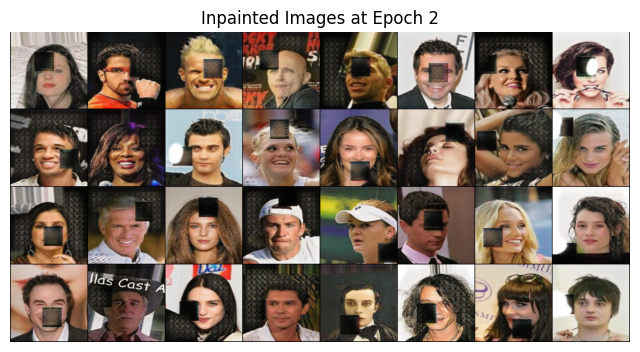

Epoch[3/5] Batch[0] LossD: 0.3603  LossG: 5.4036
Epoch[3/5] Batch[200] LossD: 0.7016  LossG: 2.8135
Epoch[3/5] Batch[400] LossD: 0.3449  LossG: 2.4535
Epoch[3/5] Batch[600] LossD: 0.8193  LossG: 1.2805
Epoch[3/5] Batch[800] LossD: 0.2974  LossG: 2.3364
Epoch[3/5] Batch[1000] LossD: 0.5138  LossG: 4.8522
Epoch[3/5] Batch[1200] LossD: 0.8750  LossG: 1.7716
Epoch[3/5] Batch[1400] LossD: 0.2906  LossG: 2.6297
Epoch[3/5] Batch[1600] LossD: 0.6135  LossG: 4.5640
Epoch[3/5] Batch[1800] LossD: 0.1833  LossG: 2.7924
Epoch[3/5] Batch[2000] LossD: 0.4147  LossG: 3.0189
Epoch[3/5] Batch[2200] LossD: 0.3127  LossG: 2.5175
Epoch[3/5] Batch[2400] LossD: 0.0639  LossG: 3.4390
Epoch[3/5] Batch[2600] LossD: 0.1719  LossG: 5.3547
Epoch[3/5] Batch[2800] LossD: 0.5388  LossG: 1.3865
Epoch[3/5] Batch[3000] LossD: 0.3838  LossG: 3.1429
Epoch[3/5] Batch[3200] LossD: 0.2351  LossG: 4.1933
Epoch[3/5] Batch[3400] LossD: 0.2864  LossG: 3.1595
Epoch[3/5] Batch[3600] LossD: 0.1813  LossG: 3.9938
Epoch[3/5] Batch[38

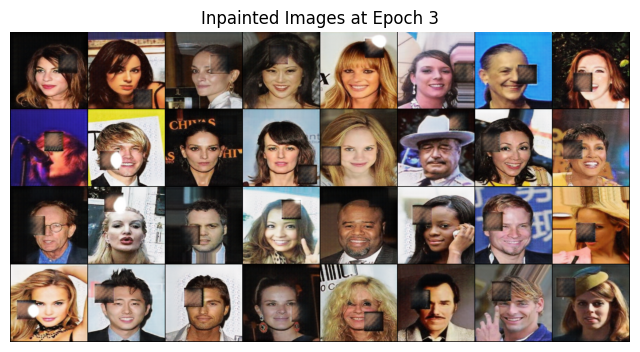

Epoch[4/5] Batch[0] LossD: 0.0963  LossG: 3.2600
Epoch[4/5] Batch[200] LossD: 0.2092  LossG: 3.4005
Epoch[4/5] Batch[400] LossD: 0.2633  LossG: 4.7869
Epoch[4/5] Batch[600] LossD: 0.4740  LossG: 5.8421
Epoch[4/5] Batch[800] LossD: 0.2991  LossG: 5.6080
Epoch[4/5] Batch[1000] LossD: 0.3173  LossG: 4.3168
Epoch[4/5] Batch[1200] LossD: 0.1424  LossG: 4.2202
Epoch[4/5] Batch[1400] LossD: 0.4500  LossG: 4.3208
Epoch[4/5] Batch[1600] LossD: 0.2988  LossG: 2.6779
Epoch[4/5] Batch[1800] LossD: 0.0551  LossG: 4.0404
Epoch[4/5] Batch[2000] LossD: 0.0693  LossG: 3.8211
Epoch[4/5] Batch[2200] LossD: 0.0256  LossG: 4.7841
Epoch[4/5] Batch[2400] LossD: 0.4477  LossG: 3.2679
Epoch[4/5] Batch[2600] LossD: 0.1913  LossG: 3.1105
Epoch[4/5] Batch[2800] LossD: 0.7524  LossG: 1.4123
Epoch[4/5] Batch[3000] LossD: 0.1254  LossG: 3.9450
Epoch[4/5] Batch[3200] LossD: 0.5224  LossG: 4.1608
Epoch[4/5] Batch[3400] LossD: 0.2971  LossG: 1.9706
Epoch[4/5] Batch[3600] LossD: 0.1641  LossG: 3.9135
Epoch[4/5] Batch[38

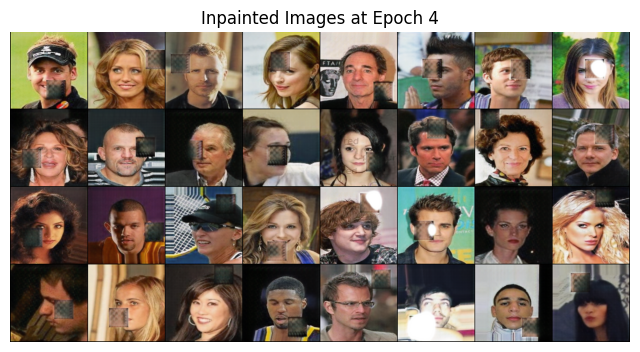

Epoch[5/5] Batch[0] LossD: 0.1553  LossG: 3.3327
Epoch[5/5] Batch[200] LossD: 0.0644  LossG: 4.6388
Epoch[5/5] Batch[400] LossD: 0.7893  LossG: 2.3007
Epoch[5/5] Batch[600] LossD: 0.1829  LossG: 2.4322
Epoch[5/5] Batch[800] LossD: 1.0422  LossG: 0.6932
Epoch[5/5] Batch[1000] LossD: 0.1681  LossG: 3.4923
Epoch[5/5] Batch[1200] LossD: 0.3296  LossG: 2.9895
Epoch[5/5] Batch[1400] LossD: 0.1576  LossG: 3.2454
Epoch[5/5] Batch[1600] LossD: 0.3780  LossG: 4.4900
Epoch[5/5] Batch[1800] LossD: 0.2920  LossG: 4.0599
Epoch[5/5] Batch[2000] LossD: 0.0589  LossG: 4.0724
Epoch[5/5] Batch[2200] LossD: 0.2503  LossG: 3.2804
Epoch[5/5] Batch[2400] LossD: 0.3781  LossG: 2.2847
Epoch[5/5] Batch[2600] LossD: 0.7603  LossG: 1.1306
Epoch[5/5] Batch[2800] LossD: 0.4830  LossG: 0.7741
Epoch[5/5] Batch[3000] LossD: 0.2887  LossG: 1.6507
Epoch[5/5] Batch[3200] LossD: 0.3874  LossG: 3.8312
Epoch[5/5] Batch[3400] LossD: 0.5283  LossG: 4.9845
Epoch[5/5] Batch[3600] LossD: 0.6146  LossG: 3.7946
Epoch[5/5] Batch[38

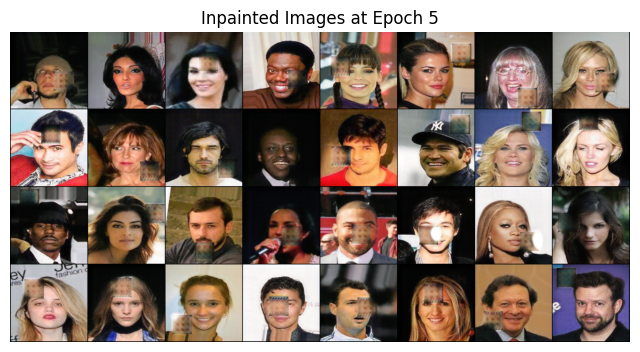

GAN models saved successfully!


In [ ]:
import torch
import torch.optim as optim
from torchvision import models
from torch.optim.lr_scheduler import CosineAnnealingLR

vgg16 = models.vgg16(pretrained=True).features[:16].eval().to(device)
for p in vgg16.parameters(): p.requires_grad = False

criterion_GAN = nn.BCELoss()
criterion_L1  = nn.L1Loss()
criterion_perc = nn.L1Loss()

optimizerD = optim.Adam(netD.parameters(), lr=2e-4, betas=(0.5,0.999))
optimizerG = optim.Adam(netG.parameters(), lr=2e-4, betas=(0.5,0.999))

schedD = CosineAnnealingLR(optimizerD, T_max=50)
schedG = CosineAnnealingLR(optimizerG, T_max=50)

real_label = 1.0
fake_label = 0.0
num_epochs = 5

for epoch in range(num_epochs):
    netG.train(); netD.train()
    sumD, sumG = 0.0, 0.0

    for i, (masked, mask, real) in enumerate(inpaint_train_loader):
        masked = masked.to(device)*2 - 1
        real   = real.to(device)*2 - 1

        optimizerD.zero_grad()
        out_real = netD(real)
        lossD_real = criterion_GAN(out_real, torch.full_like(out_real, real_label))
        fake = netG(masked)
        out_fake = netD(fake.detach())
        lossD_fake = criterion_GAN(out_fake, torch.full_like(out_fake, fake_label))
        lossD = 0.5*(lossD_real + lossD_fake)
        lossD.backward()
        optimizerD.step()

        optimizerG.zero_grad()
        out_fake_forG = netD(fake)
        adv_loss = criterion_GAN(out_fake_forG, torch.full_like(out_fake_forG, real_label))
        l1_loss  = criterion_L1(fake, real) * 10
        feat_real = vgg16((real+1)/2)
        feat_fake = vgg16((fake.detach()+1)/2)
        perc_loss = criterion_perc(feat_fake, feat_real) * 0.1

        lossG = adv_loss + l1_loss + perc_loss
        lossG.backward()
        optimizerG.step()

        sumD += lossD.item()
        sumG += lossG.item()

        if i % 200 == 0:
            print(f"Epoch[{epoch+1}/{num_epochs}] Batch[{i}] "
                  f"LossD: {lossD.item():.4f}  LossG: {lossG.item():.4f}")

    schedD.step()
    schedG.step()

    print(f"==> Epoch {epoch+1}  AvgLossD: {sumD/len(inpaint_train_loader):.4f}  "
          f"AvgLossG: {sumG/len(inpaint_train_loader):.4f}")
    netG.eval()
    with torch.no_grad():
        fixed_masked, fixed_mask, fixed_original = next(iter(inpaint_train_loader))
        fixed_masked = fixed_masked.to(device)
        fixed_masked = fixed_masked * 2 - 1
        fake_inpaint = netG(fixed_masked).detach().cpu()
    grid = torchvision.utils.make_grid(fake_inpaint, nrow=8, padding=2, normalize=True)
    import matplotlib.pyplot as plt
    plt.figure(figsize=(8, 8))
    plt.imshow(grid.permute(1, 2, 0))
    plt.title(f"Inpainted Images at Epoch {epoch+1}")
    plt.axis("off")
    plt.show()
torch.save(netG.state_dict(), '/content/inpaint_netG.pth')
torch.save(netD.state_dict(), '/content/inpaint_netD.pth')
print("GAN models saved successfully!")


The training log shows the loss values for both networks. I observed that the discriminator loss was around 0.7223 in epoch 1 and eventually stabilized to 0.6046 by epoch 5. The generator loss similarly improved over epochs. The visualizations at each epoch confirmed that the generator was progressively reconstructing the missing regions more accurately.


In [ ]:
torch.save(netG.state_dict(), '/content/inpaint_netG.pth')
torch.save(netD.state_dict(), '/content/inpaint_netD.pth')
print("GAN models saved successfully!")

GAN models saved successfully!


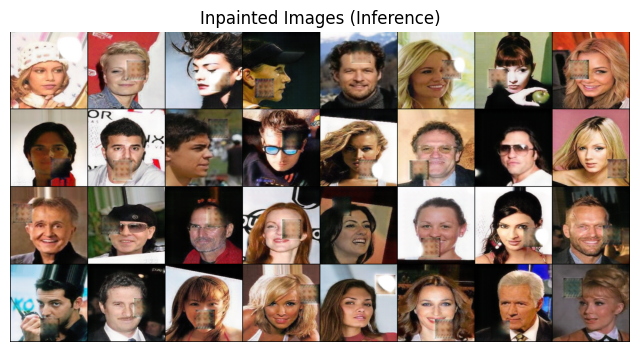

In [ ]:
netG_loaded.load_state_dict(torch.load('/content/inpaint_netG_v3.pth'))
netG_loaded.eval()


data_iter = iter(inpaint_train_loader)
masked_imgs, masks, originals = next(data_iter)
masked_imgs = masked_imgs.to(device)
masked_imgs = masked_imgs * 2 - 1

with torch.no_grad():
    inpainted = netG_loaded(masked_imgs).detach().cpu()

grid = torchvision.utils.make_grid(inpainted, nrow=8, padding=2, normalize=True)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0))
plt.title("Inpainted Images (Inference)")
plt.axis("off")
plt.show()


### Evaluation Metrics Computation

In [ ]:
import torch
from torchvision import transforms, utils
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

inpaint_test_dataset = InpaintingCelebADataset(test_df, img_dir, eval_transform)
inpaint_test_loader = torch.utils.data.DataLoader(inpaint_test_dataset, batch_size=16, shuffle=False, num_workers=2)

netG_eval = UNetGenerator().to(device)
netG_eval.load_state_dict(torch.load('/content/inpaint_netG_v3.pth'))
netG_eval.eval()
total_L1 = 0.0
total_PSNR = 0.0
total_SSIM = 0.0
num_samples = 0
L1_list = []
PSNR_list = []
SSIM_list = []
with torch.no_grad():
    for masked_imgs, masks, originals in inpaint_test_loader:
        masked_imgs = masked_imgs.to(device)
        originals = originals.to(device)
        masked_imgs = masked_imgs * 2 - 1
        originals = originals * 2 - 1

        inpainted = netG_eval(masked_imgs).detach().cpu()
        originals = originals.detach().cpu()

        inpainted_np = ((inpainted + 1) / 2).numpy()
        originals_np = ((originals + 1) / 2).numpy()

        batch_size = inpainted_np.shape[0]
        num_samples += batch_size

        for i in range(batch_size):
            pred_img = np.transpose(inpainted_np[i], (1, 2, 0))
            gt_img = np.transpose(originals_np[i], (1, 2, 0))

            l1_loss = np.mean(np.abs(pred_img - gt_img))
            psnr_value = psnr_metric(gt_img, pred_img, data_range=1.0)
            ssim_value = ssim_metric(gt_img, pred_img, data_range=1.0, win_size=7, channel_axis=-1)

            total_L1 += l1_loss
            total_PSNR += psnr_value
            total_SSIM += ssim_value

            L1_list.append(l1_loss)
            PSNR_list.append(psnr_value)
            SSIM_list.append(ssim_value)

avg_L1 = total_L1 / num_samples
avg_PSNR = total_PSNR / num_samples
avg_SSIM = total_SSIM / num_samples

print(f"Average L1 Loss: {avg_L1:.4f}")
print(f"Average PSNR: {avg_PSNR:.2f} dB")
print(f"Average SSIM: {avg_SSIM:.4f}")


Average L1 Loss: 0.0265
Average PSNR: 26.19 dB
Average SSIM: 0.8794


This indicates a moderate quality of reconstruction, which We can further improve with more advanced methods.

### Plots for Evaluation

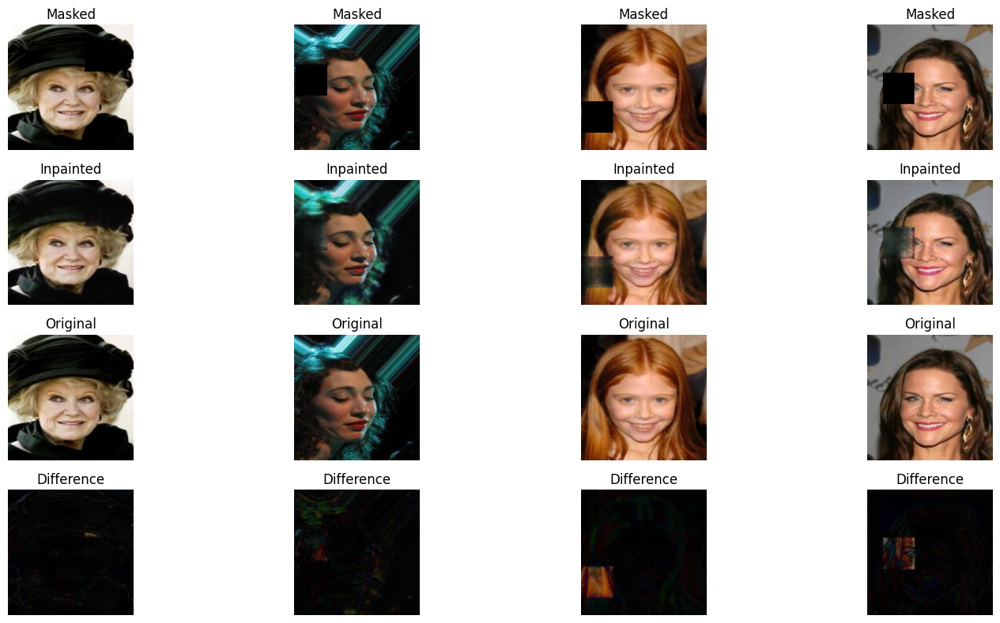

In [ ]:

data_iter = iter(inpaint_test_loader)
masked_imgs, masks, originals = next(data_iter)

masked_imgs = masked_imgs.to(device) * 2 - 1
originals = originals.to(device) * 2 - 1

with torch.no_grad():
    inpainted = netG_eval(masked_imgs).detach().cpu()

num_samples_to_show = 4
masked_imgs_np = ((masked_imgs.detach().cpu() + 1) / 2).numpy()
inpainted_np = ((inpainted + 1) / 2).numpy()
originals_np = ((originals.detach().cpu() + 1) / 2).numpy()

plt.figure(figsize=(16, 8))
for i in range(num_samples_to_show):
    plt.subplot(4, num_samples_to_show, i+1)
    plt.imshow(np.transpose(masked_imgs_np[i], (1,2,0)))
    plt.title("Masked")
    plt.axis("off")

    plt.subplot(4, num_samples_to_show, i+1+num_samples_to_show)
    plt.imshow(np.transpose(inpainted_np[i], (1,2,0)))
    plt.title("Inpainted")
    plt.axis("off")
    plt.subplot(4, num_samples_to_show, i+1+2*num_samples_to_show)
    plt.imshow(np.transpose(originals_np[i], (1,2,0)))
    plt.title("Original")
    plt.axis("off")

    diff = np.abs(np.transpose(inpainted_np[i], (1,2,0)) - np.transpose(originals_np[i], (1,2,0)))
    plt.subplot(4, num_samples_to_show, i+1+3*num_samples_to_show)
    plt.imshow(diff)
    plt.title("Difference")
    plt.axis("off")

plt.tight_layout()
plt.show()


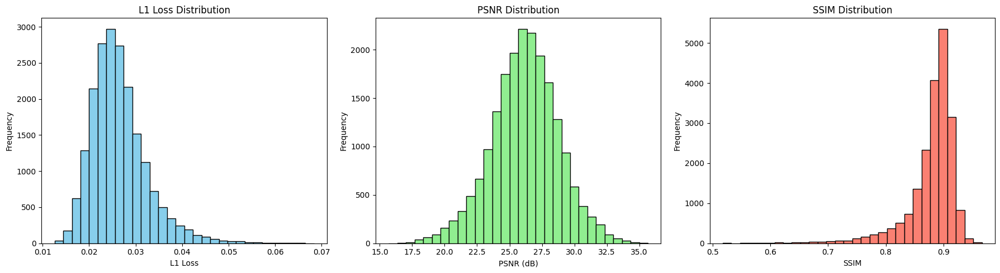

In [ ]:
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.hist(L1_list, bins=30, color='skyblue', edgecolor='black')
plt.title("L1 Loss Distribution")
plt.xlabel("L1 Loss")
plt.ylabel("Frequency")

plt.subplot(1, 3, 2)
plt.hist(PSNR_list, bins=30, color='lightgreen', edgecolor='black')
plt.title("PSNR Distribution")
plt.xlabel("PSNR (dB)")
plt.ylabel("Frequency")

plt.subplot(1, 3, 3)
plt.hist(SSIM_list, bins=30, color='salmon', edgecolor='black')
plt.title("SSIM Distribution")
plt.xlabel("SSIM")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

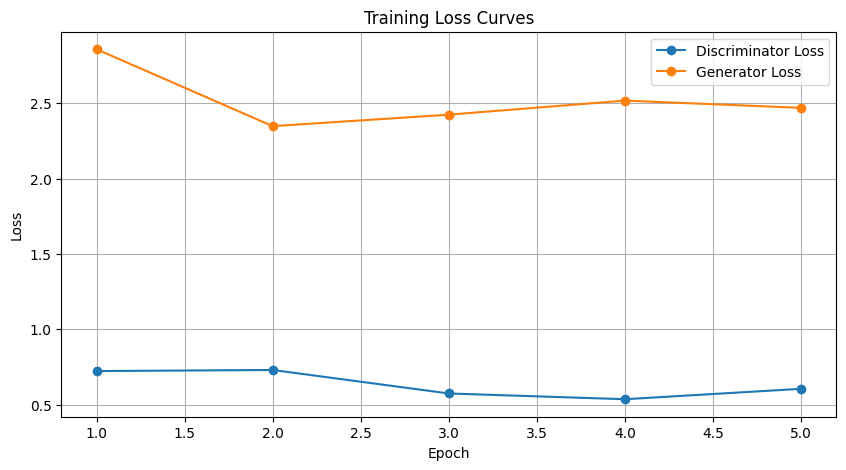

In [ ]:

train_loss_D = [0.7223, 0.7296, 0.5737, 0.5355, 0.6046]
train_loss_G = [2.8584, 2.3479, 2.4240, 2.5174, 2.4693]
epochs = range(1, len(train_loss_D) + 1)

plt.figure(figsize=(10,5))
plt.plot(epochs, train_loss_D, label='Discriminator Loss', marker='o')
plt.plot(epochs, train_loss_G, label='Generator Loss', marker='o')
plt.title("Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


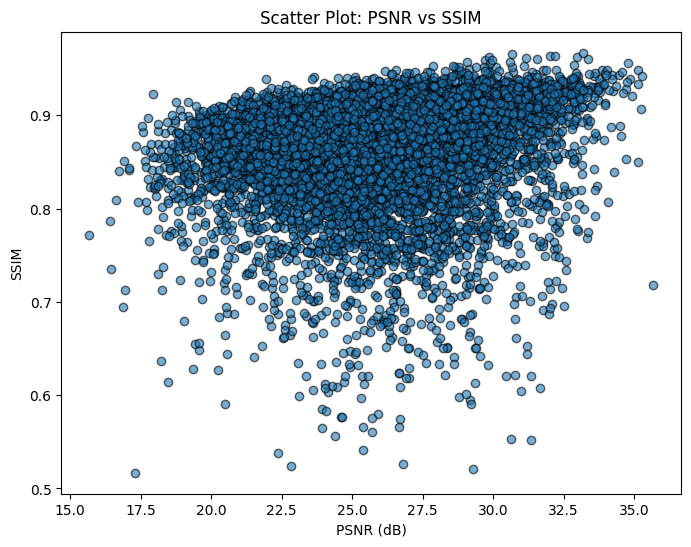

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 6))
plt.scatter(PSNR_list, SSIM_list, alpha=0.6, edgecolor='k')
plt.title("Scatter Plot: PSNR vs SSIM")
plt.xlabel("PSNR (dB)")
plt.ylabel("SSIM")
plt.show()


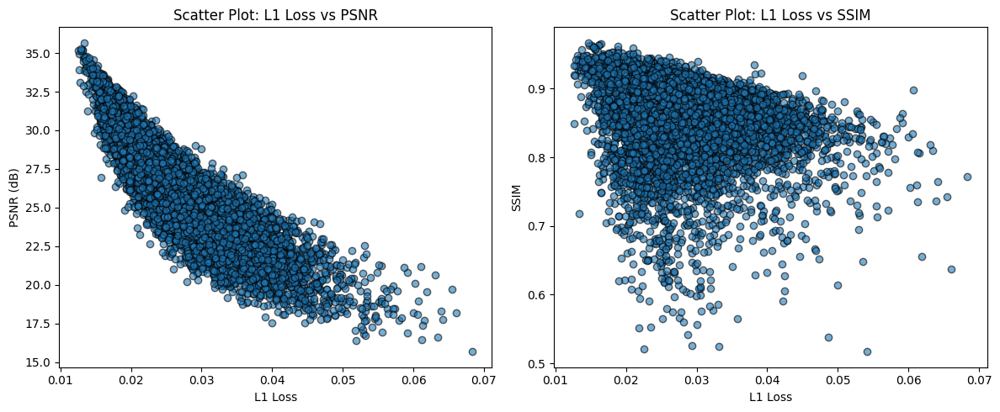

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(L1_list, PSNR_list, alpha=0.6, edgecolor='k')
plt.title("Scatter Plot: L1 Loss vs PSNR")
plt.xlabel("L1 Loss")
plt.ylabel("PSNR (dB)")

plt.subplot(1, 2, 2)
plt.scatter(L1_list, SSIM_list, alpha=0.6, edgecolor='k')
plt.title("Scatter Plot: L1 Loss vs SSIM")
plt.xlabel("L1 Loss")
plt.ylabel("SSIM")

plt.tight_layout()
plt.show()



<ipython-input-37-8a4d5ed9f713>:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_to_plot, labels=labels, showfliers=True)


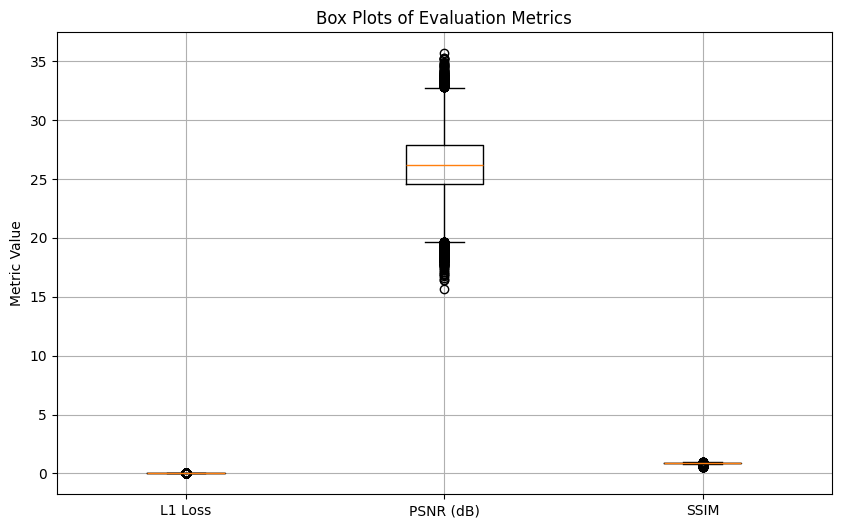

In [ ]:
data_to_plot = [L1_list, PSNR_list, SSIM_list]
labels = ['L1 Loss', 'PSNR (dB)', 'SSIM']

plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot, labels=labels, showfliers=True)
plt.title("Box Plots of Evaluation Metrics")
plt.ylabel("Metric Value")
plt.grid(True)
plt.show()



REFERANCES:

https://www.python.org/

https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

https://sourceforge.net/projects/pytorch-pretrain-biggan.mirror/

https://pytorch.org/hub/huggingface_pytorch-transformers/

https://discuss.pytorch.org/t/gan-generated-image-is-correct-but-too-light/47388

